<a href="https://colab.research.google.com/github/ENKI0311/Financial-Risk-for-Loan-Approval/blob/main/Financial_Risk_for_Loan_Approval.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Financial Risk for Loan Approval

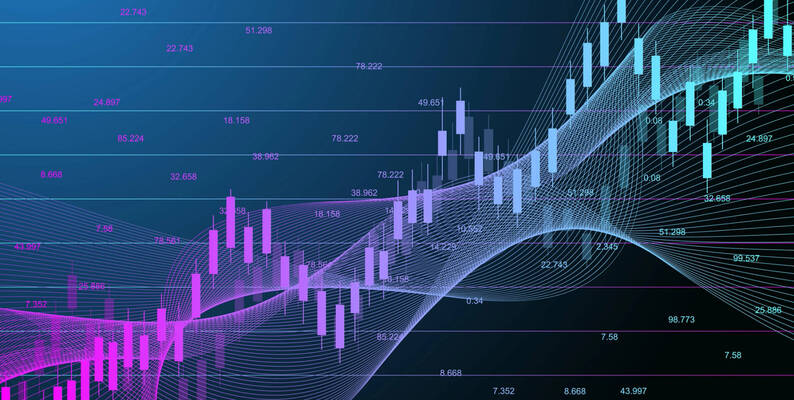

Notebook By: John Chilton

This dataset from Kaggle provides a foundation for financial analysis in loan approval, covering key techniques such as classification, regression, binary classification, and gradient boosting. It’s ideal for exploring classic finance use cases and applying machine learning models to assess financial risk in loan applications

# About Dataset

Datasets for both regression on RiskScore and binary classification on LoanAppr

Synthetic Dataset for Risk Assessment and Loan Approval Modeling
This synthetic dataset comprises 20,000 records of personal and financial data, designed to facilitate the development of predictive models for risk assessment. It serves two primary purposes:

Risk Score Regression: To predict a continuous risk score associated with each individual's likelihood of loan default or financial instability.
Binary Classification: To determine the binary outcome of loan approval, indicating whether an applicant is likely to be approved or denied for a loan.
The dataset includes diverse features such as demographic information, credit history, employment status, income levels, existing debt, and other relevant financial metrics, providing a comprehensive foundation for sophisticated data-driven analysis and decision-making.

The dataset includes the following columns:

ApplicationDate: Loan application date
Age: Applicant's age
AnnualIncome: Yearly income
CreditScore: Creditworthiness score
EmploymentStatus: Job situation
EducationLevel: Highest education attained
Experience: Work experience
LoanAmount: Requested loan size
LoanDuration: Loan repayment period
MaritalStatus: Applicant's marital state
NumberOfDependents: Number of dependents
HomeOwnershipStatus: Homeownership type
MonthlyDebtPayments: Monthly debt obligations
CreditCardUtilizationRate: Credit card usage percentage
NumberOfOpenCreditLines: Active credit lines
NumberOfCreditInquiries: Credit checks count
DebtToIncomeRatio: Debt to income proportion
BankruptcyHistory: Bankruptcy records
LoanPurpose: Reason for loan
PreviousLoanDefaults: Prior loan defaults
PaymentHistory: Past payment behavior
LengthOfCreditHistory: Credit history duration
SavingsAccountBalance: Savings account amount
CheckingAccountBalance: Checking account funds
TotalAssets: Total owned assets
TotalLiabilities: Total owed debts
MonthlyIncome: Income per month
UtilityBillsPaymentHistory: Utility payment record
JobTenure: Job duration
NetWorth: Total financial worth
BaseInterestRate: Starting interest rate
InterestRate: Applied interest rate
MonthlyLoanPayment: Monthly loan payment
TotalDebtToIncomeRatio: Total debt against income
LoanApproved: Loan approval status
RiskScore: Risk assessment score

https://www.kaggle.com/datasets/lorenzozoppelletto/financial-risk-for-loan-approval



---



# Loading the Libraries

In [1]:
import pandas as pd       # For data manipulation and loading
import numpy as np        # For numerical operations
import matplotlib.pyplot as plt  # For basic plotting
import seaborn as sns     # For more advanced visualizations
from sklearn.model_selection import train_test_split  # For splitting data
from sklearn.preprocessing import StandardScaler      # For scaling features
from sklearn.ensemble import GradientBoostingClassifier  # For gradient boosting
from sklearn.metrics import classification_report, confusion_matrix  # For evaluating models

# Load Google Drive

In [2]:
# Import and mount Google Drive in Colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Load the Dataset

In [3]:
df = pd.read_csv('/content/drive/MyDrive/lab_mount/Financial Risk for Loan Approval/Loan.csv')



*   Obeservations
*   Sanity Checks
*   EDA



In [4]:
df.head(10) # Top 10 rows for the dataset

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,LoanApproved,RiskScore
0,2018-01-01,45,39948,617,Employed,Master,22,13152,48,Married,...,3329.000000,0.724972,11,126928,0.199652,0.227590,419.805992,0.181077,0,49.0
1,2018-01-02,38,39709,628,Employed,Associate,15,26045,48,Single,...,3309.083333,0.935132,3,43609,0.207045,0.201077,794.054238,0.389852,0,52.0
2,2018-01-03,47,40724,570,Employed,Bachelor,26,17627,36,Married,...,3393.666667,0.872241,6,5205,0.217627,0.212548,666.406688,0.462157,0,52.0
3,2018-01-04,58,69084,545,Employed,High School,34,37898,96,Single,...,5757.000000,0.896155,5,99452,0.300398,0.300911,1047.506980,0.313098,0,54.0
4,2018-01-05,37,103264,594,Employed,Associate,17,9184,36,Married,...,8605.333333,0.941369,5,227019,0.197184,0.175990,330.179140,0.070210,1,36.0
5,2018-01-06,37,178310,626,Self-Employed,Master,16,15433,72,Married,...,14859.166667,0.756079,5,27071,0.217433,0.217601,385.577074,0.075211,1,44.0
6,2018-01-07,58,51250,564,Employed,High School,39,12741,48,Married,...,4270.833333,0.884275,5,21730,0.225741,0.205271,391.300352,0.170529,0,50.0
7,2018-01-08,49,97345,516,Employed,High School,23,19634,12,Divorced,...,8112.083333,0.933492,5,38621,0.226634,0.209113,1827.360055,0.260767,1,42.4
8,2018-01-09,34,116841,603,Employed,Bachelor,12,55353,60,Divorced,...,9736.750000,0.728397,3,7711,0.258853,0.291539,1762.199026,0.246509,0,61.0
9,2018-01-10,46,40615,612,Employed,Associate,19,25443,12,Married,...,3384.583333,0.615323,3,116812,0.184443,0.197271,2353.577424,0.903384,0,53.0


In [5]:
df.tail(10) # Bottom 10 rows for the dataset

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,LoanApproved,RiskScore
19990,2072-09-24,54,96264,621,Employed,Bachelor,28,38031,48,Single,...,8022.000000,0.512786,5,2604,0.222531,0.196153,1149.516437,0.185804,1,37.6
19991,2072-09-25,34,60433,555,Employed,High School,10,11299,60,Married,...,5036.083333,0.755652,5,82320,0.238799,0.226940,316.540575,0.144466,1,42.4
19992,2072-09-26,50,34282,578,Employed,High School,27,28489,48,Single,...,2856.833333,0.839598,2,10790,0.234489,0.243943,935.014359,0.479557,0,58.0
19993,2072-09-27,50,30578,588,Employed,Bachelor,29,14654,48,Single,...,2548.166667,0.889639,3,3445,0.215654,0.188936,437.333829,0.225391,0,60.0
19994,2072-09-28,51,33354,562,Employed,High School,30,22082,36,Single,...,2779.500000,0.923075,12,228771,0.226082,0.248882,876.671298,0.383764,0,50.0
19995,2072-09-29,44,30180,587,Employed,High School,19,24521,36,Married,...,2515.000000,0.826217,1,55327,0.216021,0.195574,905.767712,0.627741,0,55.0
19996,2072-09-30,56,49246,567,Employed,Associate,33,25818,36,Married,...,4103.833333,0.816618,3,64002,0.227318,0.199168,958.395633,0.334418,0,54.0
19997,2072-10-01,44,48958,645,Employed,Bachelor,20,37033,72,Married,...,4079.833333,0.887216,3,103663,0.229533,0.226766,945.427454,0.357227,0,45.0
19998,2072-10-02,60,41025,560,Employed,High School,36,14760,72,Married,...,3418.750000,0.843787,5,10600,0.249760,0.264873,411.168284,0.408678,0,59.0
19999,2072-10-03,20,53227,574,Employed,Associate,0,32055,48,Married,...,4435.583333,0.853801,5,41372,0.240055,0.242693,1049.830407,0.298006,0,59.0


In [6]:
df.shape # Shape of the dataset

(20000, 36)

In [7]:
df.info() # Information about the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 36 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ApplicationDate             20000 non-null  object 
 1   Age                         20000 non-null  int64  
 2   AnnualIncome                20000 non-null  int64  
 3   CreditScore                 20000 non-null  int64  
 4   EmploymentStatus            20000 non-null  object 
 5   EducationLevel              20000 non-null  object 
 6   Experience                  20000 non-null  int64  
 7   LoanAmount                  20000 non-null  int64  
 8   LoanDuration                20000 non-null  int64  
 9   MaritalStatus               20000 non-null  object 
 10  NumberOfDependents          20000 non-null  int64  
 11  HomeOwnershipStatus         20000 non-null  object 
 12  MonthlyDebtPayments         20000 non-null  int64  
 13  CreditCardUtilizationRate   200

In [8]:
df.describe() # Summary statistics of the dataset

,Age,AnnualIncome,CreditScore,Experience,LoanAmount,LoanDuration,NumberOfDependents,MonthlyDebtPayments,CreditCardUtilizationRate,NumberOfOpenCreditLines,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,LoanApproved,RiskScore
count,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,...,20000.000000,20000.000000,20000.000000,2.000000e+04,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000
mean,39.752600,59161.473550,571.612400,17.522750,24882.867800,54.057000,1.517300,454.292700,0.286381,3.023350,...,4891.715521,0.799918,5.002650,7.229432e+04,0.239124,0.239110,911.607052,0.402182,0.239000,50.766780
std,11.622713,40350.845168,50.997358,11.316836,13427.421217,24.664857,1.386325,240.507609,0.159793,1.736161,...,3296.771598,0.120665,2.236804,1.179200e+05,0.035509,0.042205,674.583473,0.338924,0.426483,7.778262
min,18.000000,15000.000000,343.000000,0.000000,3674.000000,12.000000,0.000000,50.000000,0.000974,0.000000,...,1250.000000,0.259203,0.000000,1.000000e+03,0.130101,0.113310,97.030193,0.016043,0.000000,28.800000
25%,32.000000,31679.000000,540.000000,9.000000,15575.000000,36.000000,0.000000,286.000000,0.160794,2.000000,...,2629.583333,0.727379,3.000000,8.734750e+03,0.213889,0.209142,493.763700,0.179693,0.000000,46.000000
50%,40.000000,48566.000000,578.000000,17.000000,21914.500000,48.000000,1.000000,402.000000,0.266673,3.000000,...,4034.750000,0.820962,5.000000,3.285550e+04,0.236157,0.235390,728.511452,0.302711,0.000000,52.000000
75%,48.000000,74391.000000,609.000000,25.000000,30835.000000,72.000000,2.000000,564.000000,0.390634,4.000000,...,6163.000000,0.892333,6.000000,8.882550e+04,0.261533,0.265532,1112.770759,0.509214,0.000000,56.000000
max,80.000000,485341.000000,712.000000,61.000000,184732.000000,120.000000,5.000000,2919.000000,0.917380,13.000000,...,25000.000000,0.999433,16.000000,2.603208e+06,0.405029,0.446787,10892.629520,4.647657,1.000000,84.000000


In [9]:
df.isnull().sum() # Checking for missing values

,0
ApplicationDate,0
Age,0
AnnualIncome,0
CreditScore,0
EmploymentStatus,0
EducationLevel,0
Experience,0
LoanAmount,0
LoanDuration,0
MaritalStatus,0


In [10]:
df.duplicated().sum() # Checking for duplicate rows

0

In [11]:
df.nunique() # Checking for unique values

,0
ApplicationDate,20000
Age,63
AnnualIncome,17516
CreditScore,322
EmploymentStatus,3
EducationLevel,5
Experience,62
LoanAmount,15578
LoanDuration,10
MaritalStatus,4


In [12]:
df.dtypes # Tyes of Data

,0
ApplicationDate,object
Age,int64
AnnualIncome,int64
CreditScore,int64
EmploymentStatus,object
EducationLevel,object
Experience,int64
LoanAmount,int64
LoanDuration,int64
MaritalStatus,object


In [13]:
df.columns # Column Names

Index(['ApplicationDate', 'Age', 'AnnualIncome', 'CreditScore',
       'EmploymentStatus', 'EducationLevel', 'Experience', 'LoanAmount',
       'LoanDuration', 'MaritalStatus', 'NumberOfDependents',
       'HomeOwnershipStatus', 'MonthlyDebtPayments',
       'CreditCardUtilizationRate', 'NumberOfOpenCreditLines',
       'NumberOfCreditInquiries', 'DebtToIncomeRatio', 'BankruptcyHistory',
       'LoanPurpose', 'PreviousLoanDefaults', 'PaymentHistory',
       'LengthOfCreditHistory', 'SavingsAccountBalance',
       'CheckingAccountBalance', 'TotalAssets', 'TotalLiabilities',
       'MonthlyIncome', 'UtilityBillsPaymentHistory', 'JobTenure', 'NetWorth',
       'BaseInterestRate', 'InterestRate', 'MonthlyLoanPayment',
       'TotalDebtToIncomeRatio', 'LoanApproved', 'RiskScore'],
      dtype='object')

In [14]:
df.BankruptcyHistory.value_counts() # Checking the distribution of the target variable

,count
BankruptcyHistory,
0,18952
1,1048


In [15]:
df.LoanPurpose.value_counts() # Checking the distribution of the target variable

,count
LoanPurpose,
Home,5925
Debt Consolidation,5027
Auto,4034
Education,3008
Other,2006


In [16]:
df.PaymentHistory.value_counts() # Checking the distribution of the target variable

,count
PaymentHistory,
23,1615
24,1596
22,1571
25,1546
21,1392
26,1378
27,1323
20,1252
28,1076


In [17]:
df.HomeOwnershipStatus.value_counts() # Checking the distribution of the target variable

,count
HomeOwnershipStatus,
Mortgage,7939
Rent,6087
Own,3938
Other,2036


In [18]:
df # Data Frame

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,LoanApproved,RiskScore
0,2018-01-01,45,39948,617,Employed,Master,22,13152,48,Married,...,3329.000000,0.724972,11,126928,0.199652,0.227590,419.805992,0.181077,0,49.0
1,2018-01-02,38,39709,628,Employed,Associate,15,26045,48,Single,...,3309.083333,0.935132,3,43609,0.207045,0.201077,794.054238,0.389852,0,52.0
2,2018-01-03,47,40724,570,Employed,Bachelor,26,17627,36,Married,...,3393.666667,0.872241,6,5205,0.217627,0.212548,666.406688,0.462157,0,52.0
3,2018-01-04,58,69084,545,Employed,High School,34,37898,96,Single,...,5757.000000,0.896155,5,99452,0.300398,0.300911,1047.506980,0.313098,0,54.0
4,2018-01-05,37,103264,594,Employed,Associate,17,9184,36,Married,...,8605.333333,0.941369,5,227019,0.197184,0.175990,330.179140,0.070210,1,36.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,2072-09-29,44,30180,587,Employed,High School,19,24521,36,Married,...,2515.000000,0.826217,1,55327,0.216021,0.195574,905.767712,0.627741,0,55.0
19996,2072-09-30,56,49246,567,Employed,Associate,33,25818,36,Married,...,4103.833333,0.816618,3,64002,0.227318,0.199168,958.395633,0.334418,0,54.0
19997,2072-10-01,44,48958,645,Employed,Bachelor,20,37033,72,Married,...,4079.833333,0.887216,3,103663,0.229533,0.226766,945.427454,0.357227,0,45.0
19998,2072-10-02,60,41025,560,Employed,High School,36,14760,72,Married,...,3418.750000,0.843787,5,10600,0.249760,0.264873,411.168284,0.408678,0,59.0


# EDA

### Introduction to Exploratory Data Analysis (EDA)

Exploratory Data Analysis (EDA) is a crucial step in understanding the dataset and uncovering insights before building any models. Since the dataset is already clean with no duplicates or missing values, we can proceed to systematically explore it.

The goals of EDA in this context are:

1. **Understand the Data Structure**: Identify the types of variables (numerical, categorical) and their distributions.
2. **Summarize the Data**: Use descriptive statistics to capture central tendencies, variability, and distribution shapes.
3. **Identify Relationships**: Detect correlations or patterns between variables, especially those related to financial risk and loan approval.
4. **Spot Anomalies or Outliers**: Highlight any potential outliers that might affect model performance.
5. **Gain Intuition**: Develop a deep understanding of the dataset to guide feature engineering and model selection.

---

### EDA Approach

1. **Univariate Analysis**:
   - Examine individual variables to understand their distribution and key statistics.
   - Use visualizations such as histograms, box plots, and bar charts.
   - Focus on the target variable (e.g., financial risk or loan approval outcome) to understand its distribution.

2. **Bivariate Analysis**:
   - Explore relationships between the target variable and other features.
   - Use scatter plots, correlation heatmaps, and grouped box plots for numerical features.
   - Use cross-tabulations and stacked bar charts for categorical features.

3. **Multivariate Analysis** (if necessary):
   - Investigate interactions between multiple variables and their joint impact on the target variable.
   - Use techniques like pair plots and 3D visualizations to gain deeper insights.

---

### Creating Functions for EDA

To streamline the EDA process, the following modular functions can be created:

1. **Descriptive Statistics**:
   - Function to calculate and display mean, median, standard deviation, skewness, and kurtosis for numerical features.

2. **Distribution Plots**:
   - Function to plot histograms and box plots for numerical features.
   - Function to visualize bar charts for categorical features.

3. **Correlation Analysis**:
   - Function to generate and visualize correlation matrices or heatmaps.

4. **Target Variable Analysis**:
   - Function to analyze the target variable's distribution and its relationship with key features.

5. **Outlier Detection**:
   - Function to identify and visualize outliers using box plots and z-scores.

---

### Next Steps

1. **Define EDA Functions**:
   Begin coding the above-mentioned functions for EDA in the notebook. Each function will serve a specific purpose to maintain modularity and reusability.

2. **Perform Univariate Analysis**:
   Apply the functions to explore individual variables in the dataset.

3. **Expand to Bivariate Analysis**:
   Investigate relationships between the target variable and predictors.

Once the above steps are implemented, we can proceed to model building and hypothesis testing. Let me know when you're ready to define the EDA functions!

# Functions for visuals

Histogram function

In [19]:
import matplotlib.pyplot as plt

def plot_histograms(df, num_cols=None, bins=30):
    """
    Plot histograms for numerical columns in a dataframe.

    Parameters:
    df (DataFrame): The dataframe containing the data.
    num_cols (list): List of numerical column names to plot. If None, it will auto-detect numerical columns.
    bins (int): Number of bins for the histogram. Default is 30.

    Returns:
    None
    """
    if num_cols is None:
        # Auto-detect numerical columns if not specified
        num_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

    for col in num_cols:
        plt.figure(figsize=(8, 5))
        plt.hist(df[col], bins=bins, color='blue', alpha=0.7, edgecolor='black')
        plt.title(f"Histogram of {col}")
        plt.xlabel(col)
        plt.ylabel("Frequency")
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.show()

Descriptive Statistics Function

Provides a summary of key statistics for numerical columns.

In [20]:
def descriptive_statistics(df, num_cols=None):
    """
    Generate descriptive statistics for numerical columns in the dataframe.

    Parameters:
    df (DataFrame): The dataframe containing the data.
    num_cols (list): List of numerical column names. If None, it will auto-detect numerical columns.

    Returns:
    DataFrame: A dataframe with descriptive statistics.
    """
    if num_cols is None:
        num_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

    return df[num_cols].describe().transpose()

Box Plot Function
Helps visualize the distribution and detect outliers in numerical data.

In [21]:
def plot_boxplots(df, num_cols=None):
    """
    Plot boxplots for numerical columns in a dataframe.

    Parameters:
    df (DataFrame): The dataframe containing the data.
    num_cols (list): List of numerical column names to plot. If None, it will auto-detect numerical columns.

    Returns:
    None
    """
    if num_cols is None:
        num_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

    for col in num_cols:
        plt.figure(figsize=(8, 5))
        plt.boxplot(df[col], vert=False, patch_artist=True, boxprops=dict(facecolor="blue", alpha=0.5))
        plt.title(f"Boxplot of {col}")
        plt.xlabel(col)
        plt.show()

Box Plot Function

Helps visualize the distribution and detect outliers in numerical data.

In [22]:
def plot_boxplots(df, num_cols=None):
    """
    Plot boxplots for numerical columns in a dataframe.

    Parameters:
    df (DataFrame): The dataframe containing the data.
    num_cols (list): List of numerical column names to plot. If None, it will auto-detect numerical columns.

    Returns:
    None
    """
    if num_cols is None:
        num_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

    for col in num_cols:
        plt.figure(figsize=(8, 5))
        plt.boxplot(df[col], vert=False, patch_artist=True, boxprops=dict(facecolor="blue", alpha=0.5))
        plt.title(f"Boxplot of {col}")
        plt.xlabel(col)
        plt.show()

Correlation Heatmap

Shows pairwise correlations between numerical columns.

In [23]:
import numpy as np

def plot_correlation_heatmap(df, num_cols=None, top_n=None):
    """
    Plot a cleaner correlation heatmap for numerical columns in a dataframe.

    Parameters:
    df (DataFrame): The dataframe containing the data.
    num_cols (list): List of numerical column names to include. If None, auto-detect numerical columns.
    top_n (int): Number of top correlated columns to include. If None, include all.

    Returns:
    None
    """
    if num_cols is None:
        num_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

    # Calculate the correlation matrix
    corr_matrix = df[num_cols].corr()

    # If top_n is specified, keep only the top correlated columns
    if top_n:
        correlated_features = corr_matrix.abs().unstack().sort_values(ascending=False)
        top_features = correlated_features[top_n:].reset_index()['level_0'].unique()
        corr_matrix = corr_matrix.loc[top_features, top_features]

    # Generate a mask for the upper triangle
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

    # Plot the heatmap
    plt.figure(figsize=(12, 10))
    sns.heatmap(corr_matrix, mask=mask, annot=True, fmt=".2f", cmap="coolwarm", cbar=True, square=True,
                annot_kws={"size": 8})
    plt.title("Correlation Heatmap (Filtered)", fontsize=14)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.show()

Bar Chart for Categorical Features


Visualize frequency distributions of categorical columns.



In [24]:
def plot_bar_charts(df, cat_cols=None, max_categories=20):
    """
    Plot bar charts for categorical columns in a dataframe.

    Parameters:
    df (DataFrame): The dataframe containing the data.
    cat_cols (list): List of categorical column names. If None, auto-detect categorical columns.
    max_categories (int): Maximum number of unique categories to plot. Columns with more will be skipped.

    Returns:
    None
    """
    if cat_cols is None:
        cat_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()

    for col in cat_cols:
        if df[col].nunique() > max_categories:
            print(f"Skipping '{col}' due to too many unique values ({df[col].nunique()} categories).")
            continue

        plt.figure(figsize=(8, 5))
        df[col].value_counts().plot(kind='bar', color='blue', alpha=0.7, edgecolor='black')
        plt.title(f"Bar Chart of {col}")
        plt.xlabel(col)
        plt.ylabel("Frequency")
        plt.xticks(rotation=45)
        plt.show()

Scatter Plot for Numerical Features

Analyze relationships between two numerical variables.

In [25]:
def plot_scatter(df, x_col, y_col):
    """
    Plot a scatter plot for two numerical columns with error handling for missing columns.

    Parameters:
    df (DataFrame): The dataframe containing the data.
    x_col (str): The column for the x-axis.
    y_col (str): The column for the y-axis.

    Returns:
    None
    """
    # Check if columns exist
    if x_col not in df.columns:
        raise KeyError(f"Column '{x_col}' does not exist in the DataFrame.")
    if y_col not in df.columns:
        raise KeyError(f"Column '{y_col}' does not exist in the DataFrame.")

    # Create the scatter plot
    plt.figure(figsize=(8, 5))
    plt.scatter(df[x_col], df[y_col], alpha=0.7, color='blue', edgecolor='black')
    plt.title(f"Scatter Plot: {x_col} vs {y_col}")
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()

Target Variable Analysis

Explore the relationship between the target variable and other features.

In [26]:
def target_analysis(df, target_col, cat_cols=None, num_cols=None):
    """
    Analyze the target variable with respect to categorical and numerical features.

    Parameters:
    df (DataFrame): The dataframe containing the data.
    target_col (str): The target column name.
    cat_cols (list): List of categorical column names. If None, auto-detect categorical columns.
    num_cols (list): List of numerical column names. If None, auto-detect numerical columns.

    Returns:
    None
    """
    # Categorical Analysis
    if cat_cols is None:
        cat_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()

    for col in cat_cols:
        plt.figure(figsize=(8, 5))
        pd.crosstab(df[col], df[target_col]).plot(kind='bar', stacked=True, alpha=0.7)
        plt.title(f"Target Analysis with {col}")
        plt.xlabel(col)
        plt.ylabel("Count")
        plt.xticks(rotation=45)
        plt.show()

    # Numerical Analysis
    if num_cols is None:
        num_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

    for col in num_cols:
        plt.figure(figsize=(8, 5))
        df.groupby(target_col)[col].plot(kind='kde', legend=True)
        plt.title(f"Target Analysis with {col}")
        plt.xlabel(col)
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.show()

# Univariate Analysis

Histogram

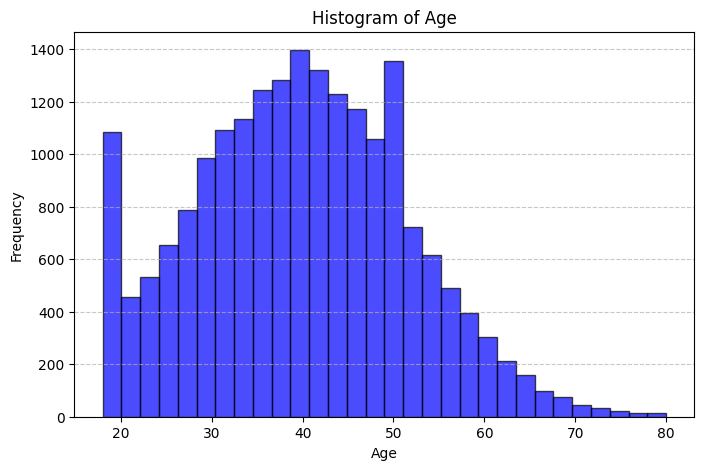

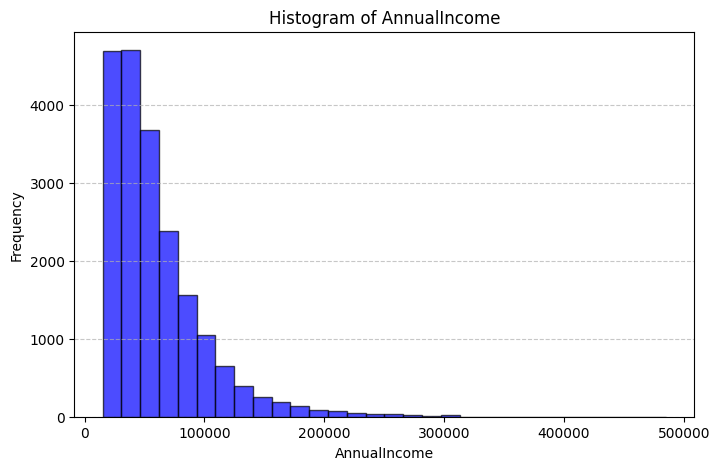

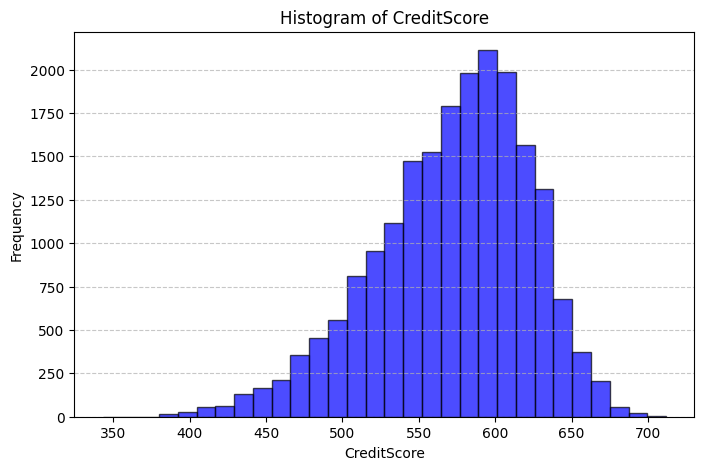

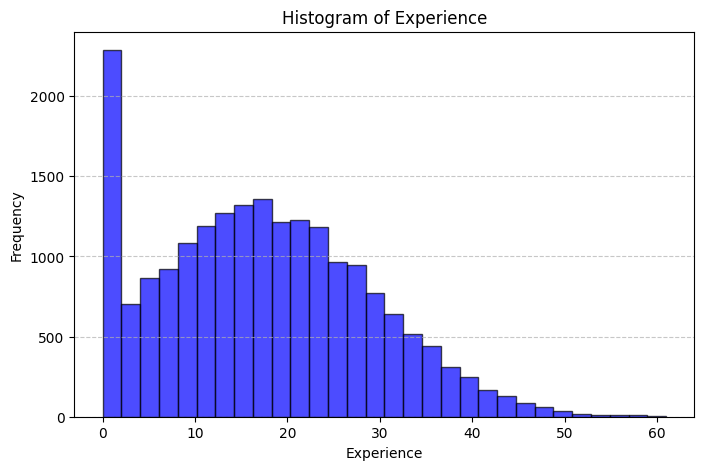

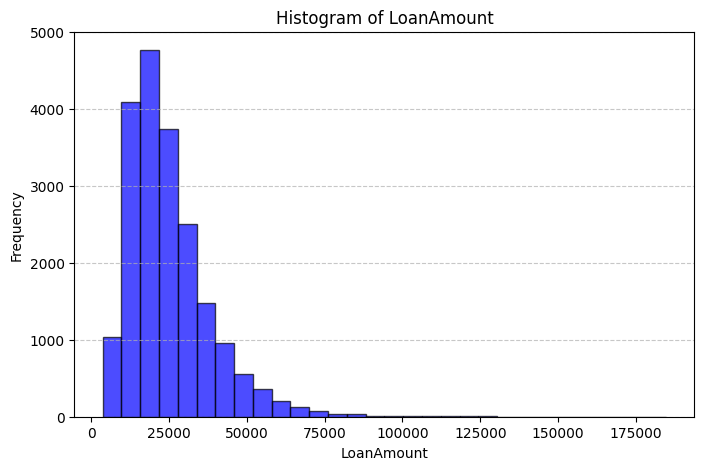

...

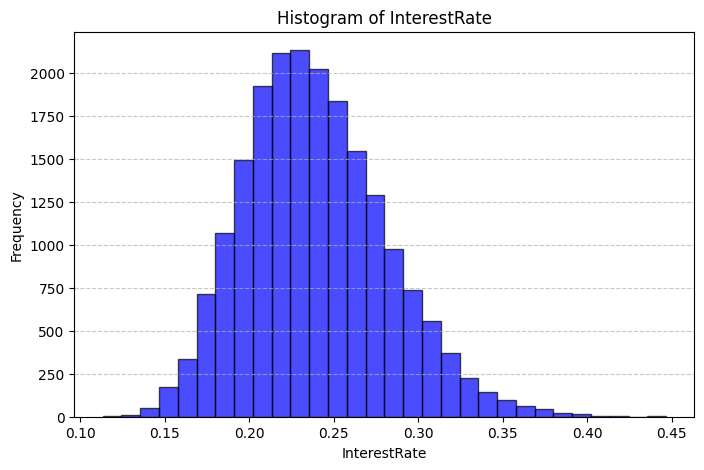

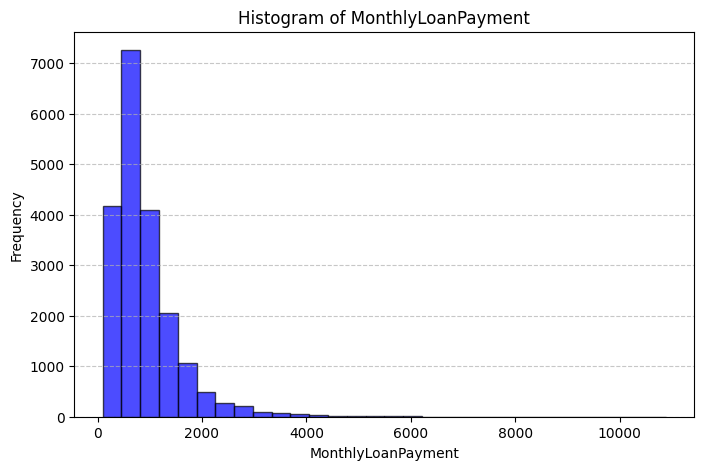

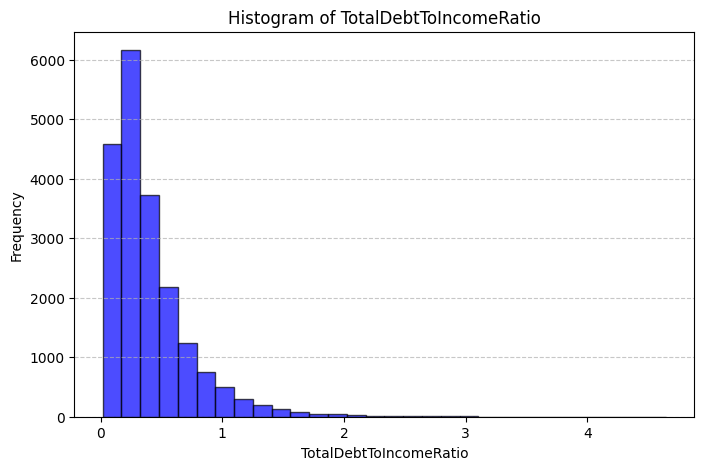

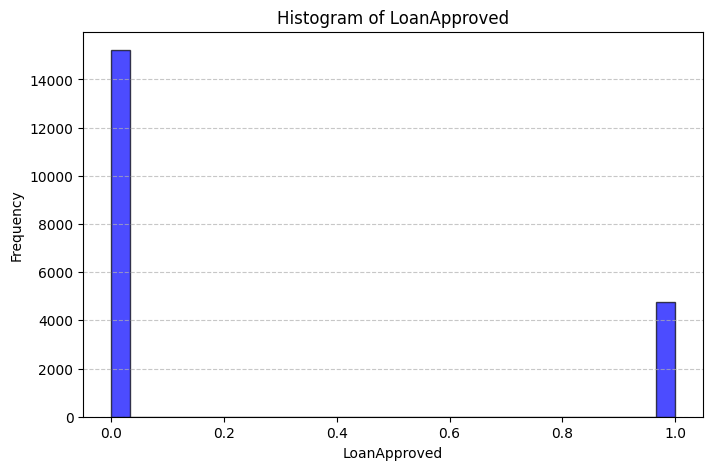

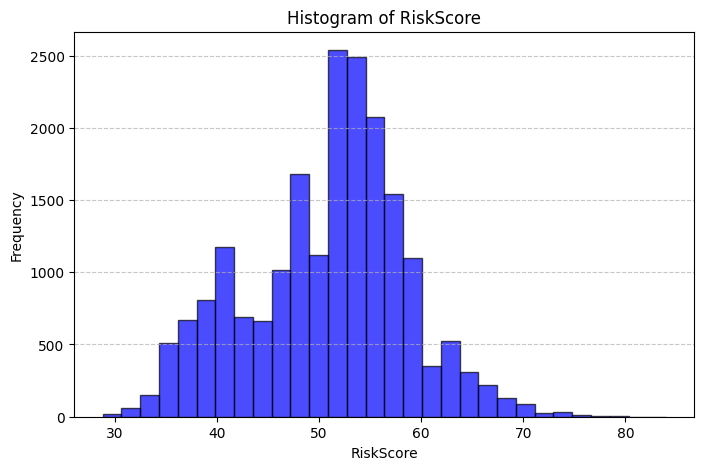

In [27]:
# Example usage
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
plot_histograms(df, numerical_cols)

 Descriptive Statistics

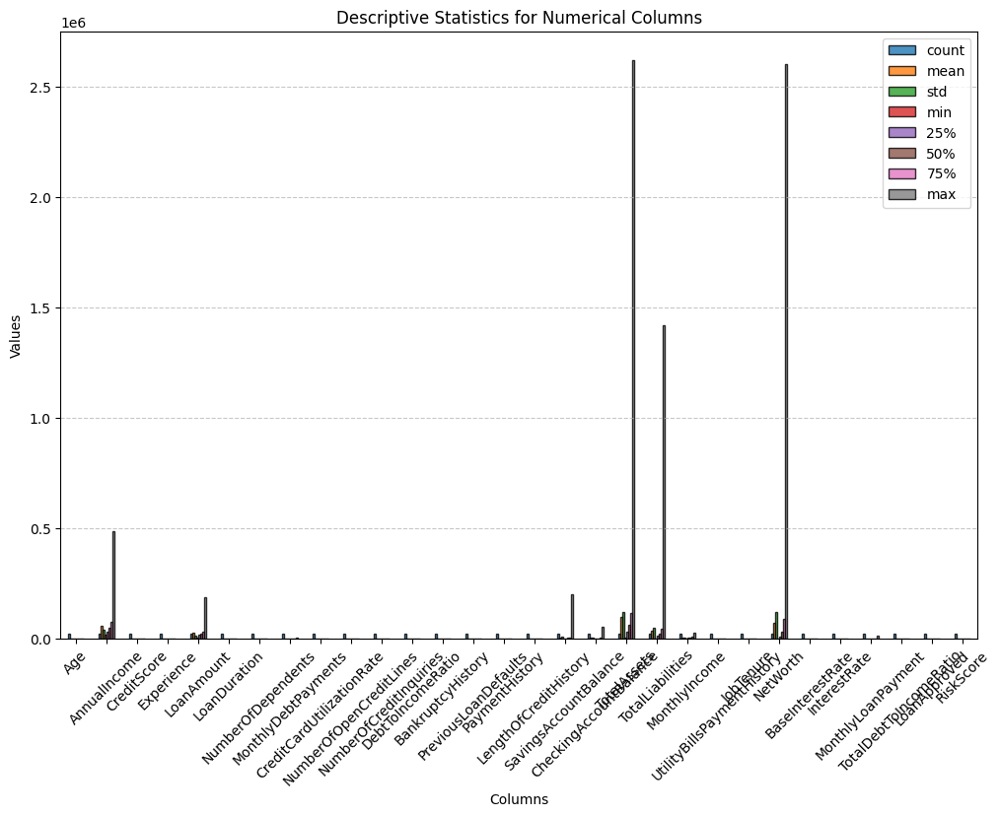

In [28]:
# Assuming desc_stats is the result of your descriptive_statistics function

# Create a visual for the descriptive statistics
desc_stats = descriptive_statistics(df)

desc_stats.plot(kind='bar', figsize=(12, 8), alpha=0.8, edgecolor='black')
plt.title('Descriptive Statistics for Numerical Columns')
plt.xlabel('Columns')
plt.ylabel('Values')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(loc='upper right')
plt.show()

Boxplot Visual

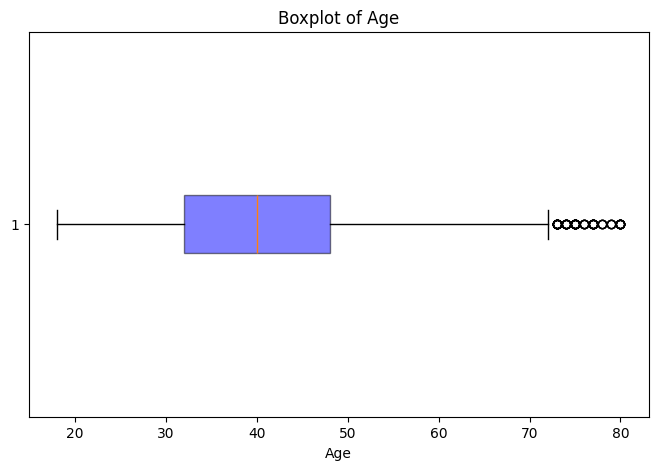

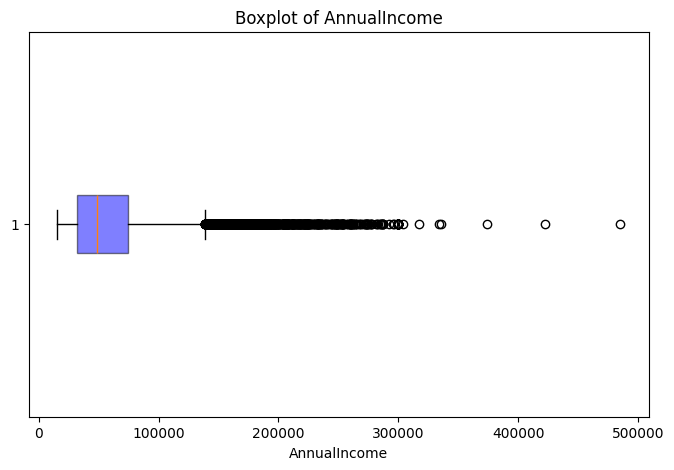

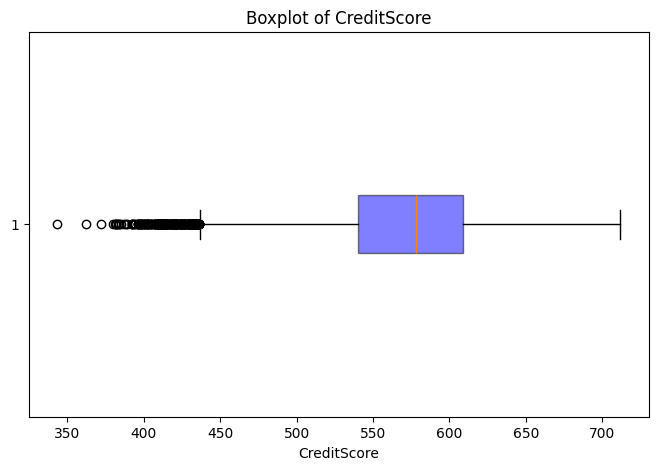

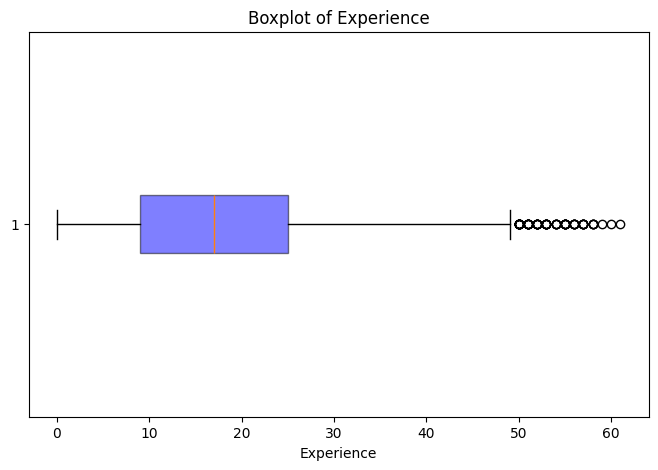

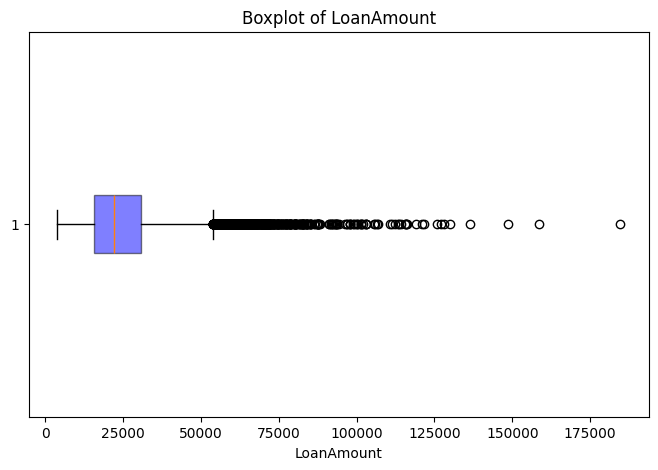

...

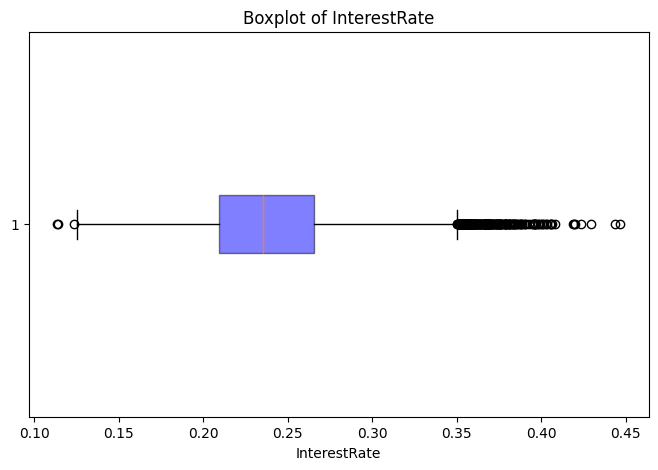

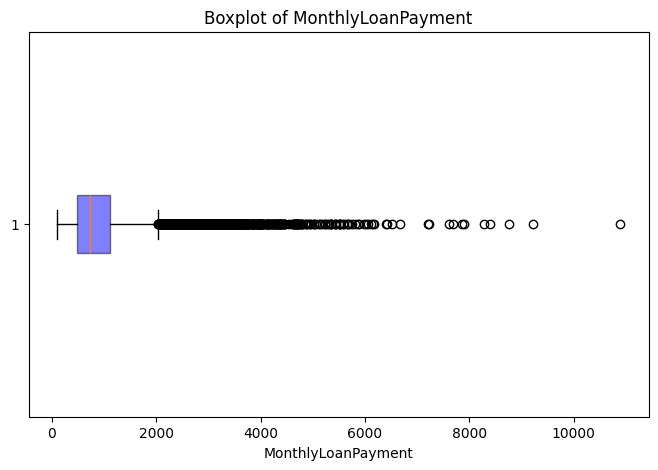

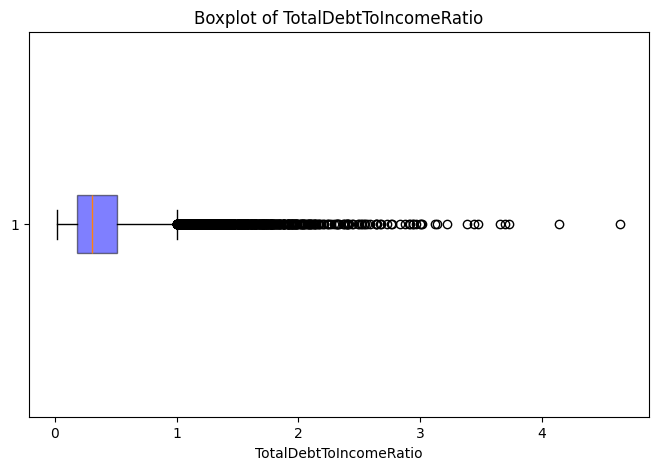

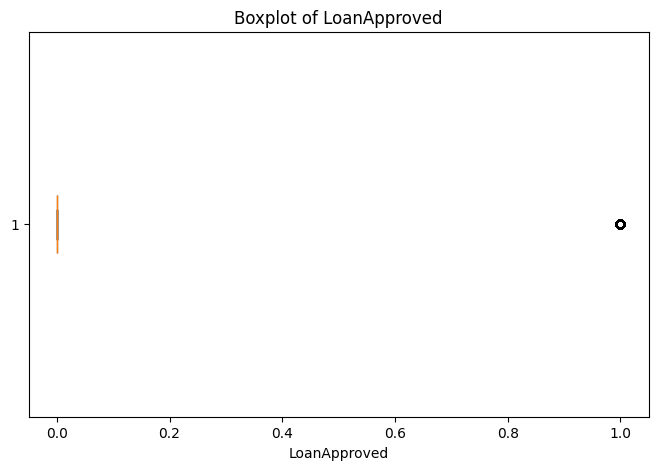

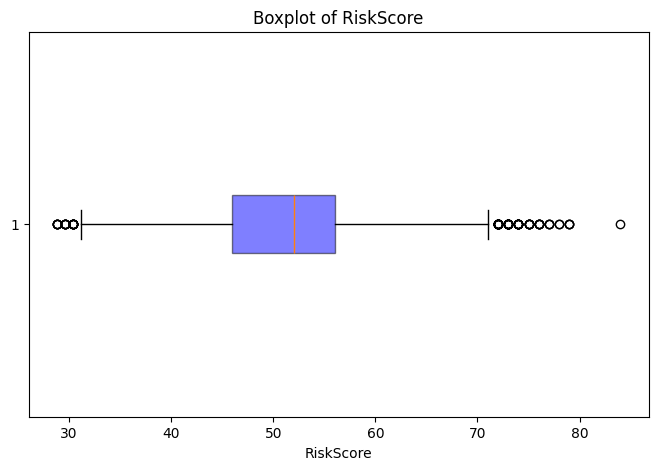

In [29]:
# Assuming your function `plot_boxplots` is defined and working

# Call the function to generate boxplots for all numerical columns
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Generate boxplots
plot_boxplots(df, numerical_columns)

# Bar Chart Plots

Skipping 'ApplicationDate' due to too many unique values (20000 categories).


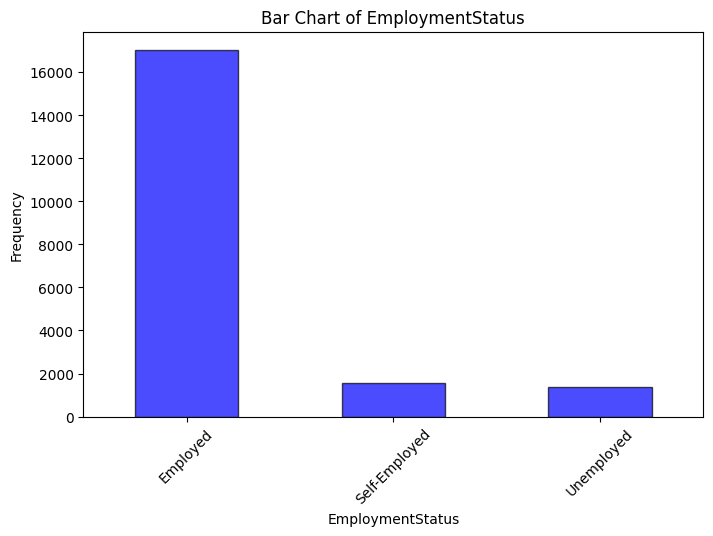

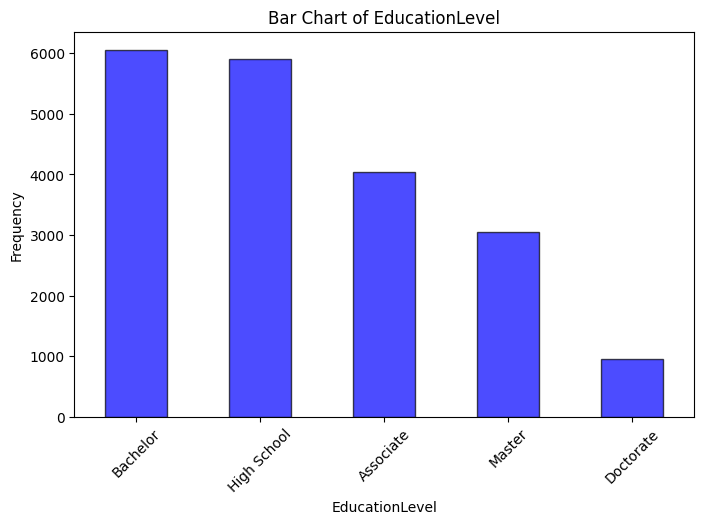

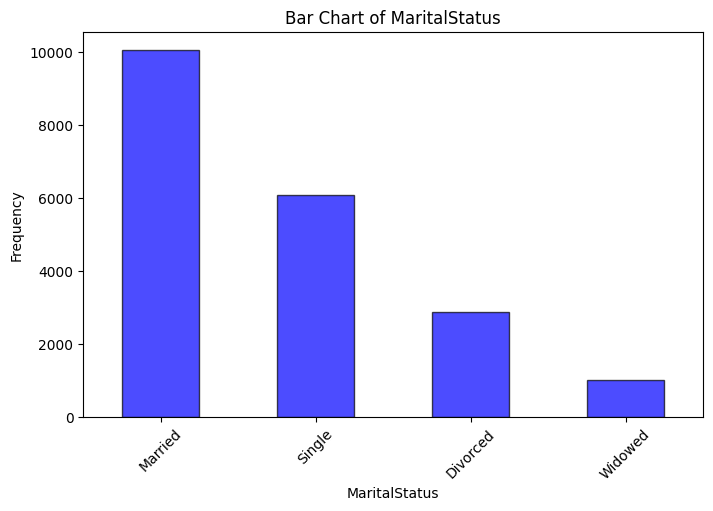

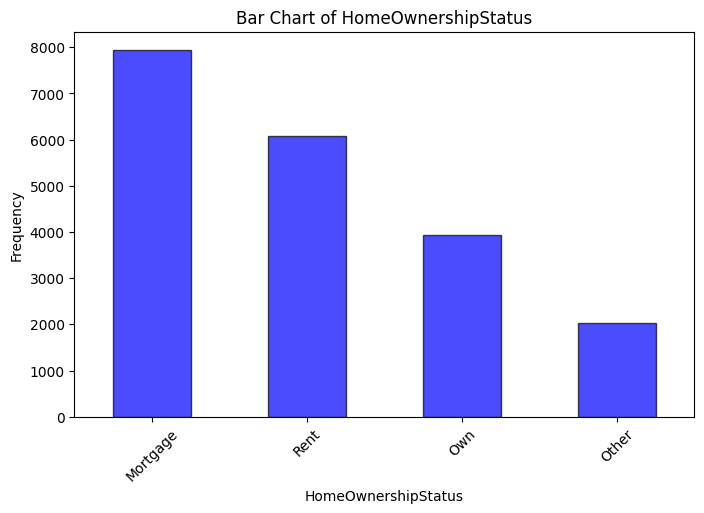

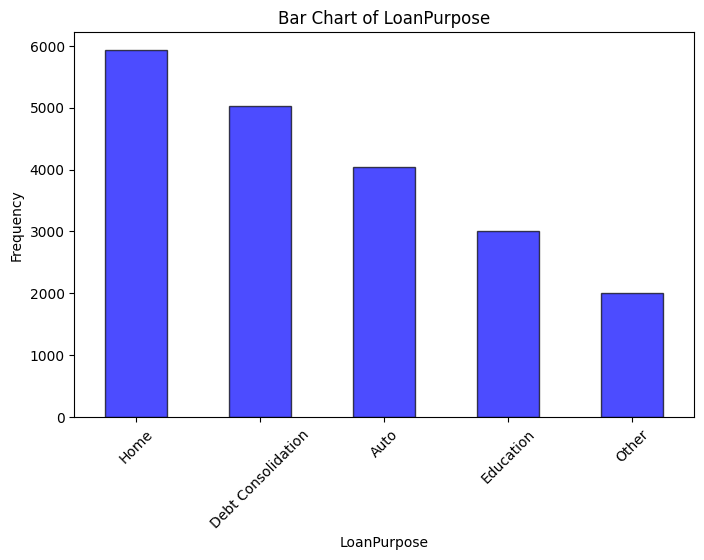

In [30]:
# Assuming your function `plot_bar_charts` is defined and working

# Identify categorical columns
categorical_columns = df.select_dtypes(include=['object', 'category']).columns.tolist()

# Generate bar charts
plot_bar_charts(df, categorical_columns)

Checking Skewness and Kurtosis (Numerical Columns)
Why? Understanding the shape of your data's distribution can guide transformation steps (e.g., log transformation for highly skewed data).
Output: Numerical values for skewness and kurtosis.

In [31]:
def check_skewness_kurtosis(df, num_cols=None):
    if num_cols is None:
        num_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

    skew_kurt = df[num_cols].agg(['skew', 'kurtosis']).transpose()
    skew_kurt.columns = ['Skewness', 'Kurtosis']
    return skew_kurt
skew_kurt_df = check_skewness_kurtosis(df)
print(skew_kurt_df)

                            Skewness   Kurtosis
Age                         0.185964  -0.310585
AnnualIncome                2.088948   6.851505
CreditScore                -0.596727   0.231691
Experience                  0.339981  -0.370905
LoanAmount                  1.833688   6.768544
LoanDuration                0.651330   0.167285
NumberOfDependents          0.639919  -0.486165
MonthlyDebtPayments         1.653435   4.919596
CreditCardUtilizationRate   0.601131  -0.086265
NumberOfOpenCreditLines     0.599662   0.371324
NumberOfCreditInquiries     1.012065   1.155686
DebtToIncomeRatio           0.593858  -0.126026
BankruptcyHistory           4.017672  14.143103
PreviousLoanDefaults        2.665941   5.107752
PaymentHistory              0.213465   0.019650
LengthOfCreditHistory       0.002989  -1.195703
SavingsAccountBalance       6.060099  79.171685
CheckingAccountBalance      4.746142  43.134131
TotalAssets                 5.311326  56.217956
TotalLiabilities            5.848874  78

Outlier Analysis
Why? Outliers can distort relationships in bivariate analysis and modeling.
How? Summarize the number of outliers in each numerical column using IQR.

In [32]:
def outlier_summary(df, num_cols=None):
    if num_cols is None:
        num_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

    outliers = {}
    for col in num_cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers[col] = ((df[col] < lower_bound) | (df[col] > upper_bound)).sum()

    return pd.DataFrame.from_dict(outliers, orient='index', columns=['Outlier Count'])
outlier_counts = outlier_summary(df)
print(outlier_counts)

                            Outlier Count
Age                                    64
AnnualIncome                          947
CreditScore                           242
Experience                             75
LoanAmount                            746
LoanDuration                            0
NumberOfDependents                      0
MonthlyDebtPayments                   744
CreditCardUtilizationRate             130
NumberOfOpenCreditLines               249
NumberOfCreditInquiries                16
DebtToIncomeRatio                     143
BankruptcyHistory                    1048
PreviousLoanDefaults                 2001
PaymentHistory                        241
LengthOfCreditHistory                   0
SavingsAccountBalance                1592
CheckingAccountBalance               1522
TotalAssets                          1442
TotalLiabilities                     1533
MonthlyIncome                         925
UtilityBillsPaymentHistory            294
JobTenure                         

Feature Cardinality (Categorical Columns)
Why? High cardinality in categorical features may lead to overfitting or difficulty in encoding.
How? Count the unique categories for each categorical column.

In [33]:
def categorical_cardinality(df, cat_cols=None):
    if cat_cols is None:
        cat_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()

    cardinality = {col: df[col].nunique() for col in cat_cols}
    return pd.DataFrame.from_dict(cardinality, orient='index', columns=['Unique Categories'])
cardinality_df = categorical_cardinality(df)
print(cardinality_df)

                     Unique Categories
ApplicationDate                  20000
EmploymentStatus                     3
EducationLevel                       5
MaritalStatus                        4
HomeOwnershipStatus                  4
LoanPurpose                          5


# Bivariate Analysis

Numerical vs. Numerical (Scatter Plot + Correlation Matrix)
Scatter Plot for visualizing pairwise relationships:

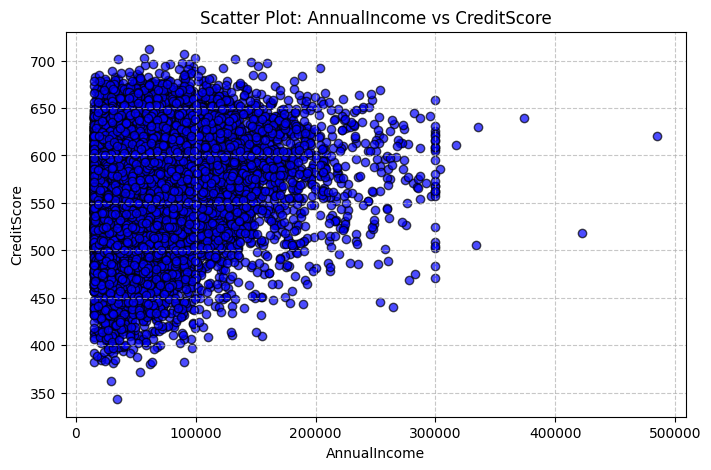

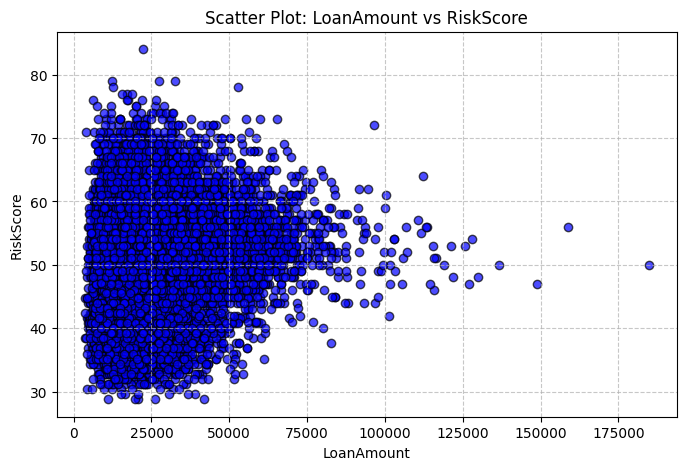

In [34]:
plot_scatter(df, 'AnnualIncome', 'CreditScore')
plot_scatter(df, 'LoanAmount', 'RiskScore')

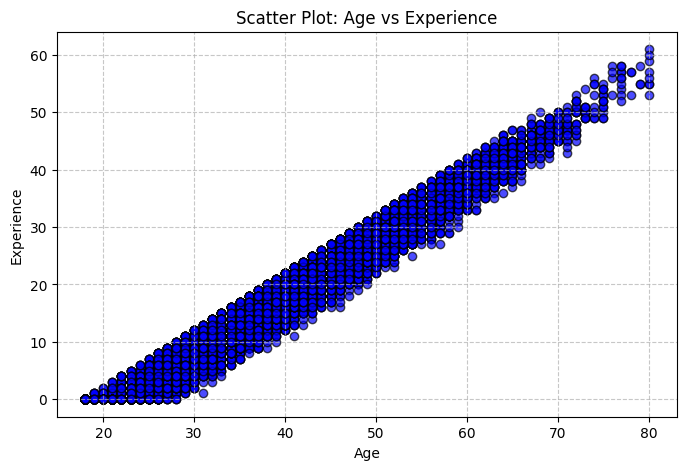

In [35]:
plot_scatter(df, 'Age', 'Experience')

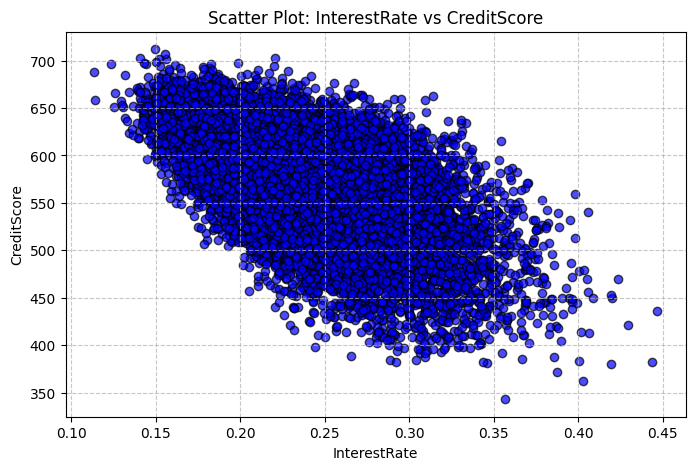

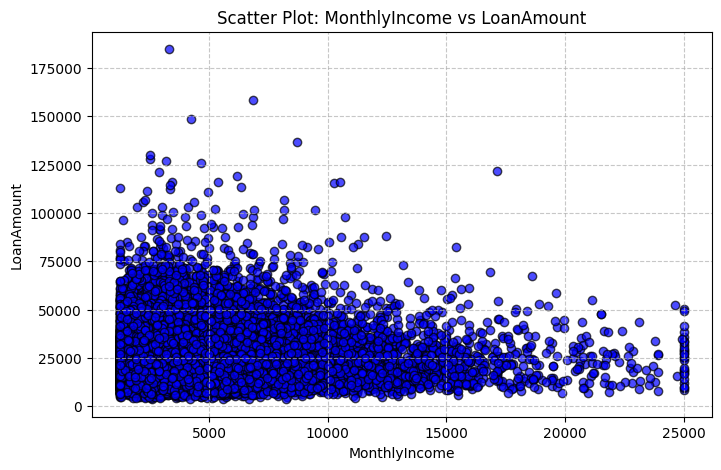

In [36]:
plot_scatter(df, 'InterestRate', 'CreditScore')
plot_scatter(df, 'MonthlyIncome', 'LoanAmount')

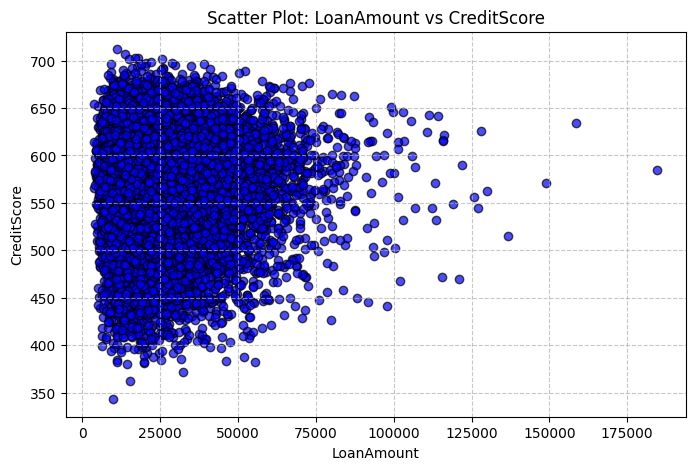

In [37]:
plot_scatter(df, 'LoanAmount', 'CreditScore')

Correlation Heatmap
The function computes the correlation matrix for the numerical columns in your DataFrame.
A heatmap is plotted, showing the pairwise correlations.
Positive correlations are in warm colors (e.g., red).
Negative correlations are in cool colors (e.g., blue).
Values are annotated to help interpret the correlations.


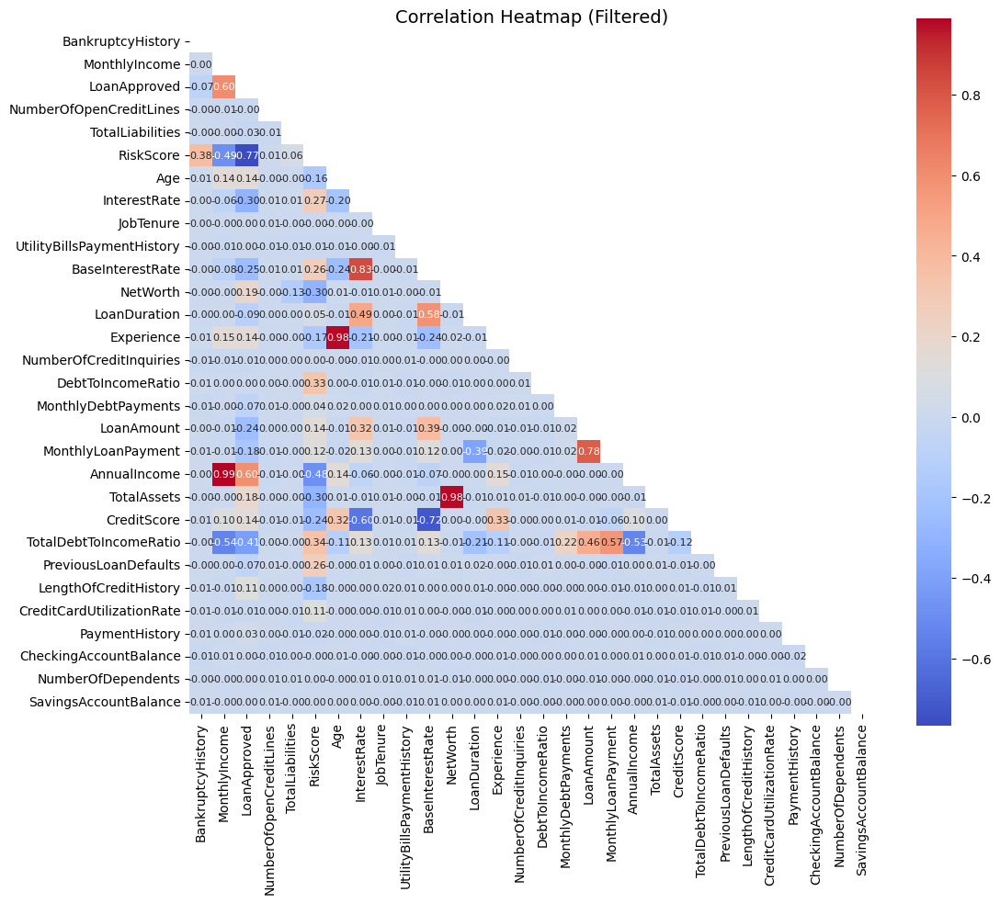

In [38]:
# Automatically detect numerical columns
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Generate the heatmap with improvements
plot_correlation_heatmap(df, num_cols=numerical_columns, top_n=10)

Bivariate Analysis Techniques
1. Categorical vs. Numerical Analysis
Purpose: Examine how a numerical variable changes across categories of a categorical variable.
Techniques:
Grouped Boxplots: Show the distribution of a numerical variable for each category.
Violin Plots: Combine boxplots and kernel density estimation for more detail.

## Violin PLot Fuction

In [39]:
def plot_grouped_violin(df, num_col, cat_col):
    """
    Plot a violin plot of a numerical variable grouped by a categorical variable.

    Parameters:
    df (DataFrame): The dataframe containing the data.
    num_col (str): The numerical column to plot.
    cat_col (str): The categorical column to group by.

    Returns:
    None
    """
    plt.figure(figsize=(10, 6))
    sns.violinplot(x=cat_col, y=num_col, data=df, palette='Blues')
    plt.title(f"{num_col} by {cat_col}")
    plt.xticks(rotation=45)
    plt.show()

Violin PLot

<ipython-input-39-e8f8c5a8f5d0>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=cat_col, y=num_col, data=df, palette='Blues')


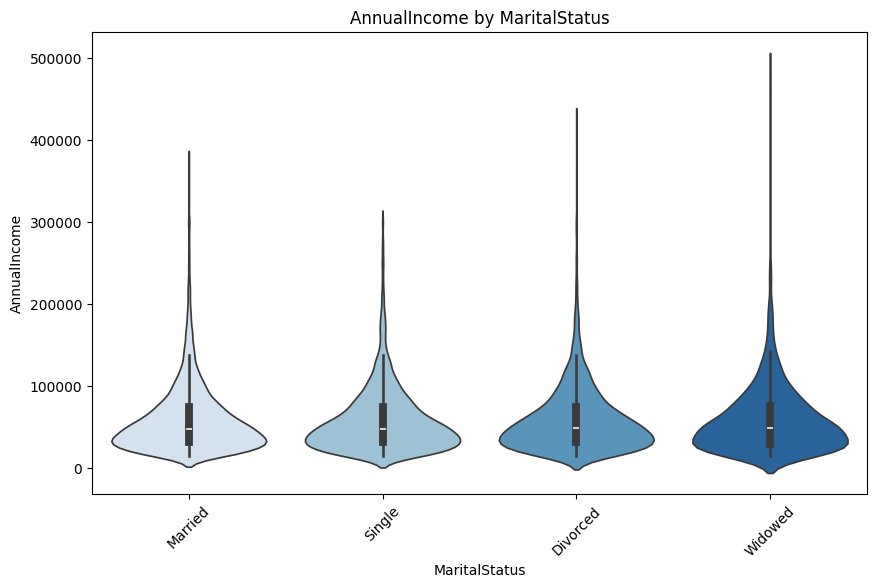

In [40]:
plot_grouped_violin(df, 'AnnualIncome', 'MaritalStatus');

<ipython-input-39-e8f8c5a8f5d0>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=cat_col, y=num_col, data=df, palette='Blues')


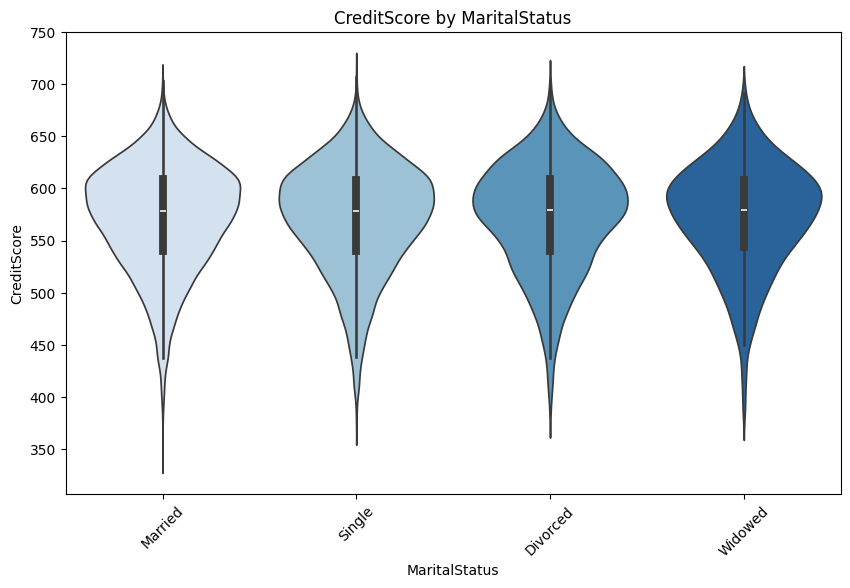

In [41]:
plot_grouped_violin(df, 'CreditScore', 'MaritalStatus');

# Stacked Bar Chart Function

In [42]:
def plot_stacked_bar(df, cat_col1, cat_col2):
    """
    Plot a stacked bar chart for two categorical columns.

    Parameters:
    df (DataFrame): The dataframe containing the data.
    cat_col1 (str): The first categorical column (X-axis).
    cat_col2 (str): The second categorical column (stacked categories).

    Returns:
    None
    """
    crosstab = pd.crosstab(df[cat_col1], df[cat_col2])
    crosstab.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='Blues', alpha=0.8, edgecolor='black')
    plt.title(f"Stacked Bar Chart of {cat_col1} and {cat_col2}")
    plt.xlabel(cat_col1)
    plt.ylabel("Count")
    plt.xticks(rotation=45)
    plt.legend(title=cat_col2, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

Bar Chart Plots

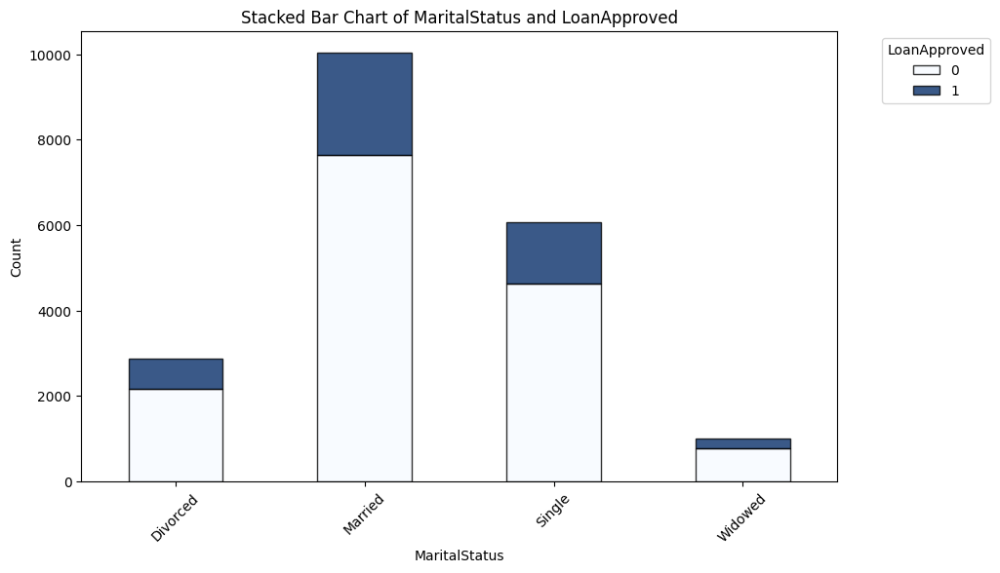

In [43]:
plot_stacked_bar(df, 'MaritalStatus', 'LoanApproved')

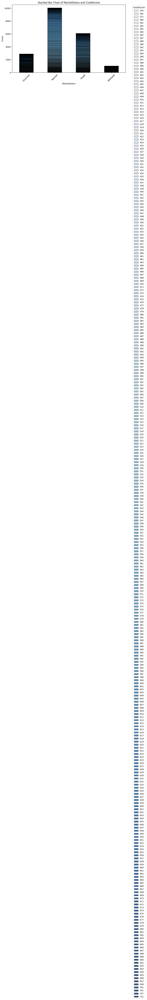

In [44]:
plot_stacked_bar(df, 'MaritalStatus', 'CreditScore')



---


Numerical vs. Numerical Analysis (Advanced)
Purpose: Go beyond scatter plots to examine detailed relationships.
Techniques:
Pair Plots: Visualize pairwise scatter plots for all numerical variables.
Regression Plots: Show a scatter plot with a regression line to indicate trends.
Density Plots: Joint distribution of two numerical variables.

# Pair Plot Function

In [45]:
def plot_pairwise_relationships(df, num_cols):
    """
    Plot pairwise scatter plots for all numerical columns.

    Parameters:
    df (DataFrame): The dataframe containing the data.
    num_cols (list): List of numerical columns.

    Returns:
    None
    """
    sns.pairplot(df[num_cols], diag_kind='kde', corner=True, plot_kws={'alpha': 0.7})
    plt.show()

Pair Plots

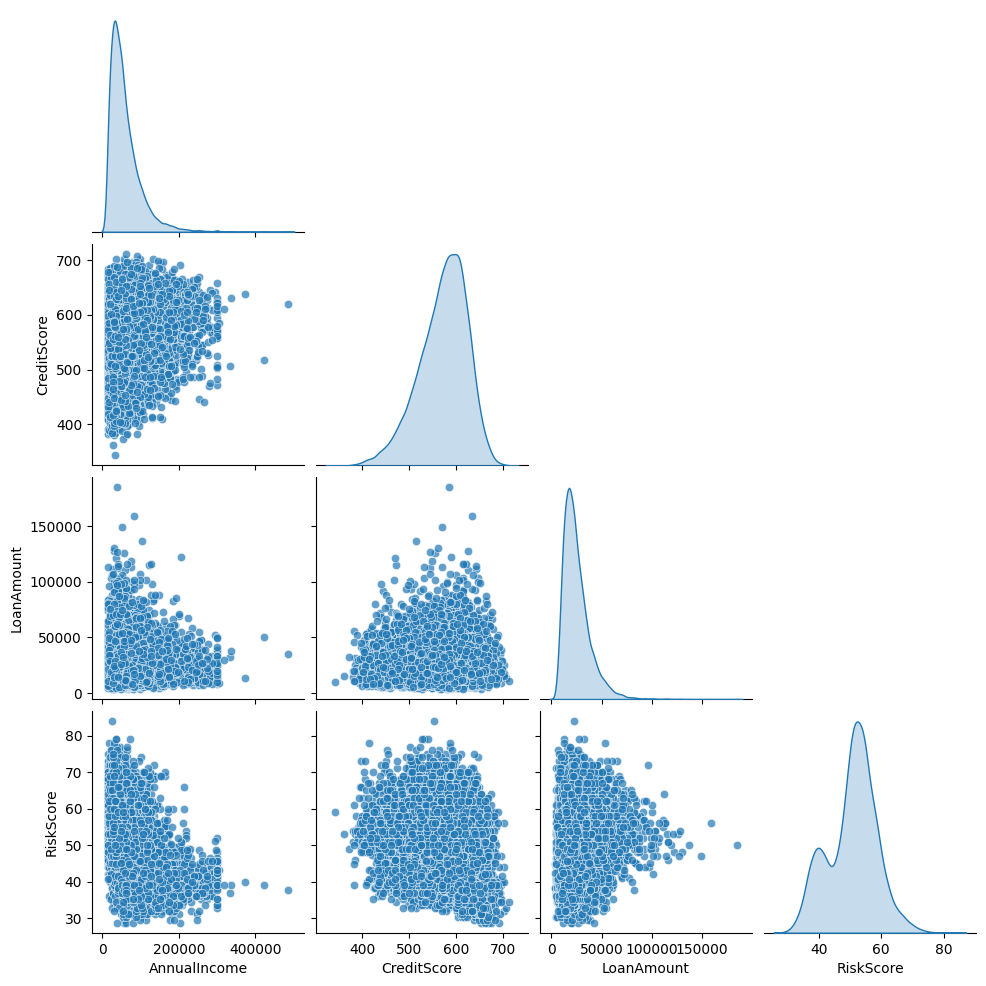

In [46]:
numerical_columns = ['AnnualIncome', 'CreditScore', 'LoanAmount', 'RiskScore']
plot_pairwise_relationships(df, numerical_columns)

In [47]:
import torch

if torch.cuda.is_available():
    print("GPU is available:", torch.cuda.get_device_name(0))
else:
    print("No GPU is available.")

GPU is available: NVIDIA A100-SXM4-40GB


In [48]:
import tensorflow as tf
print("Available GPUs:", tf.config.list_physical_devices('GPU'))

Available GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


Statistical Tests (Optional)
Perform statistical tests to confirm the strength of relationships:

Numerical vs. Numerical: Pearson or Spearman correlation.
Numerical vs. Categorical: ANOVA or Kruskal-Wallis test.
Categorical vs. Categorical: Chi-square test of independence.

Chi-Square

In [49]:
from scipy.stats import chi2_contingency

def chi_square_test(df, cat_col1, cat_col2):
    crosstab = pd.crosstab(df[cat_col1], df[cat_col2])
    chi2, p, _, _ = chi2_contingency(crosstab)
    return {"chi2": chi2, "p-value": p}

result = chi_square_test(df, 'MaritalStatus', 'LoanApproved')
print(result)

{'chi2': 1.781340751519077, 'p-value': 0.6190037909522508}


Pearson Correlation
Purpose: Measures linear relationships between two numerical variables.
Output: A value between -1 and 1:
1: Perfect positive linear correlation.
-1: Perfect negative linear correlation.
0: No linear correlation.
When to Use:
When the relationship between variables is expected to be linear.
Both variables are continuous and normally distributed.

In [50]:
from scipy.stats import pearsonr

def compute_pearson_correlation(df, col1, col2):
    corr, p_value = pearsonr(df[col1], df[col2])
    return {"Pearson Correlation": corr, "p-value": p_value}

# Example usage
result = compute_pearson_correlation(df, 'AnnualIncome', 'CreditScore')
print(result)

{'Pearson Correlation': 0.10404468144058523, 'p-value': 2.9309235266976867e-49}


Spearman Correlation
Purpose: Measures monotonic relationships (non-linear but consistently increasing or decreasing).
Output: A value between -1 and 1:
1: Perfect positive monotonic correlation.
-1: Perfect negative monotonic correlation.
0: No monotonic correlation.
When to Use:
When the relationship is non-linear but monotonic.
For ordinal or non-normally distributed data.

Spearman Correlation

In [51]:
from scipy.stats import spearmanr

def compute_spearman_correlation(df, col1, col2):
    corr, p_value = spearmanr(df[col1], df[col2])
    return {"Spearman Correlation": corr, "p-value": p_value}

# Example usage
result = compute_spearman_correlation(df, 'AnnualIncome', 'CreditScore')
print(result)

{'Spearman Correlation': 0.1195557061967159, 'p-value': 1.4274079135322288e-64}


Automating Correlation for All Pairs
If you want to compute Pearson or Spearman correlations for all numerical variable pairs:

Example for Pearson:

In [52]:
def compute_all_pearson(df, num_cols):
    corr_matrix = df[num_cols].corr(method='pearson')
    return corr_matrix

# Example usage
numerical_columns = ['AnnualIncome', 'CreditScore', 'LoanAmount', 'RiskScore']
pearson_corr_matrix = compute_all_pearson(df, numerical_columns)
print(pearson_corr_matrix)

              AnnualIncome  CreditScore  LoanAmount  RiskScore
AnnualIncome      1.000000     0.104045   -0.004116  -0.483289
CreditScore       0.104045     1.000000   -0.010834  -0.240198
LoanAmount       -0.004116    -0.010834    1.000000   0.137981
RiskScore        -0.483289    -0.240198    0.137981   1.000000


Example for Spearman:

In [53]:
def compute_all_spearman(df, num_cols):
    corr_matrix = df[num_cols].corr(method='spearman')
    return corr_matrix

# Example usage
spearman_corr_matrix = compute_all_spearman(df, numerical_columns)
print(spearman_corr_matrix)

              AnnualIncome  CreditScore  LoanAmount  RiskScore
AnnualIncome      1.000000     0.119556   -0.009416  -0.466251
CreditScore       0.119556     1.000000   -0.010881  -0.257837
LoanAmount       -0.009416    -0.010881    1.000000   0.139966
RiskScore        -0.466251    -0.257837    0.139966   1.000000


Visualizing Correlations
You can visualize these correlations using a heatmap:

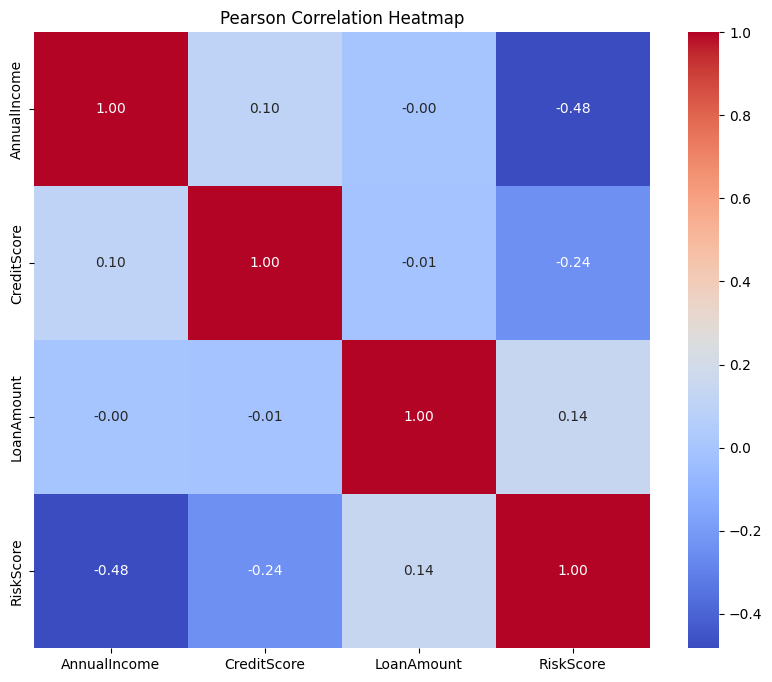

In [54]:
import seaborn as sns
import matplotlib.pyplot as plt

# Heatmap for correlation matrix
def plot_correlation_heatmap(corr_matrix, title="Correlation Heatmap"):
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True)
    plt.title(title)
    plt.show()

# Example usage
plot_correlation_heatmap(pearson_corr_matrix, title="Pearson Correlation Heatmap")

Cluster Map
Why: Shows hierarchical clustering and correlations together.
How: Use sns.clustermap to group similar rows or features.

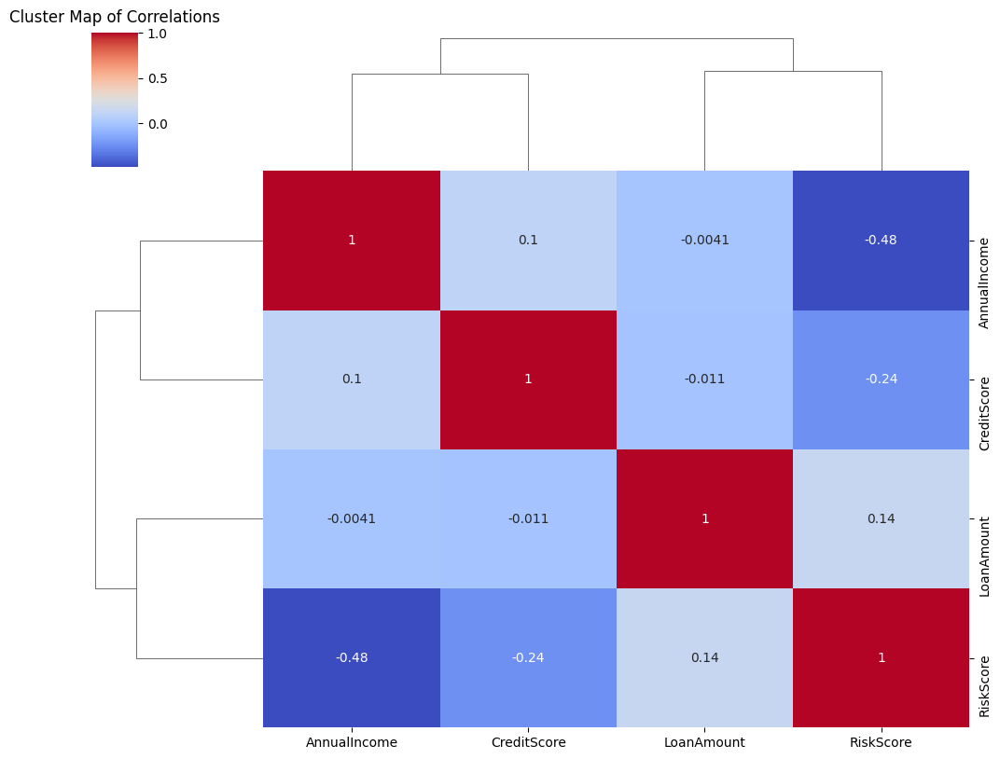

In [55]:
def plot_clustermap(df, num_cols):
    """
    Create a clustermap for numerical columns in the dataframe.

    Parameters:
    df (DataFrame): The dataframe containing the data.
    num_cols (list): List of numerical column names.

    Returns:
    None
    """
    sns.clustermap(df[num_cols].corr(), annot=True, cmap='coolwarm', figsize=(10, 8))
    plt.title("Cluster Map of Correlations", y=1.02)
    plt.show()

# Example usage
numerical_columns = ['AnnualIncome', 'CreditScore', 'LoanAmount', 'RiskScore']
plot_clustermap(df, numerical_columns)

3D Scatter Plot
Why: Adds depth by visualizing three numerical variables simultaneously.
How: Use matplotlib for a 3D scatter plot.

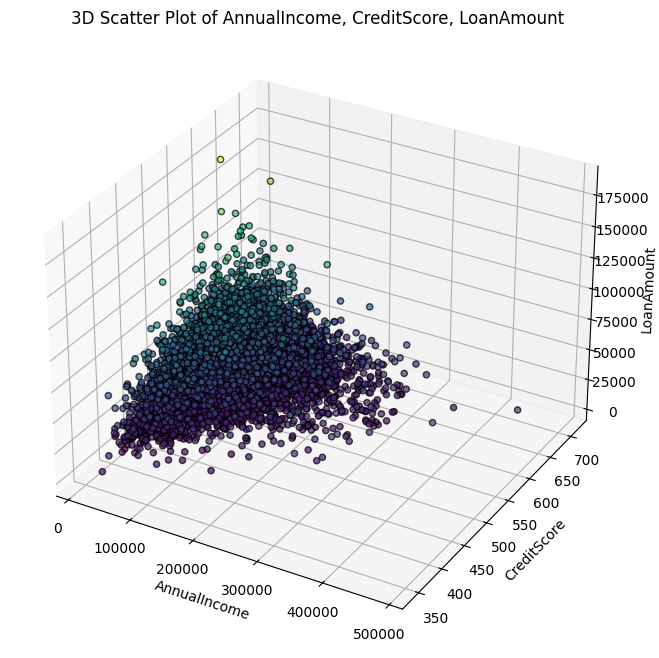

In [56]:
from mpl_toolkits.mplot3d import Axes3D

def plot_3d_scatter(df, x_col, y_col, z_col):
    """
    Create a 3D scatter plot for three numerical variables.

    Parameters:
    df (DataFrame): The dataframe containing the data.
    x_col (str): X-axis variable.
    y_col (str): Y-axis variable.
    z_col (str): Z-axis variable.

    Returns:
    None
    """
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(df[x_col], df[y_col], df[z_col], alpha=0.7, c=df[z_col], cmap='viridis', edgecolor='k')
    ax.set_title(f"3D Scatter Plot of {x_col}, {y_col}, {z_col}")
    ax.set_xlabel(x_col)
    ax.set_ylabel(y_col)
    ax.set_zlabel(z_col)
    plt.show()

# Example usage
plot_3d_scatter(df, 'AnnualIncome', 'CreditScore', 'LoanAmount')

#  Feature Engineering

Feature engineering is crucial for improving the predictive power of your model. In a Financial Risk for Loan Approval dataset, focus on:

Creating Derived Features: Generate new features from existing data.
Transforming Features: Make raw data more useful (e.g., scaling, encoding).
Selecting Features: Remove redundant or irrelevant variables.


# Automating Missing Value Imputation

In [57]:
def impute_missing_values(df):
    for col in df.select_dtypes(include=['int64', 'float64']).columns:
        df[col].fillna(df[col].median(), inplace=True)
    for col in df.select_dtypes(include=['object']).columns:
        df[col].fillna(df[col].mode()[0], inplace=True)
    return df

# Automated Outlier Handling

In [58]:
def remove_outliers(df, num_cols=None, threshold=3):
    if num_cols is None:
        num_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
    for col in num_cols:
        df = df[(np.abs(df[col] - df[col].mean()) / df[col].std()) < threshold]
    return df

# Pipeline for Preprocessing

In [59]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler

def build_pipeline():
    num_features = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
    cat_features = df.select_dtypes(include=['object']).columns.tolist()

    num_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler())
    ])

    cat_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('onehot', OneHotEncoder(handle_unknown='ignore'))
    ])

    preprocessor = ColumnTransformer(transformers=[
        ('num', num_transformer, num_features),
        ('cat', cat_transformer, cat_features)
    ])
    return preprocessor

# ROC Curve

In [62]:
from sklearn.metrics import roc_curve, auc
def plot_roc_curve(model, X_test, y_test):
    y_pred_prob = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC Curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='red', lw=1, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()
    return fpr, tpr, roc_auc

# Time Series Analysis: Trends in ApplicationDate


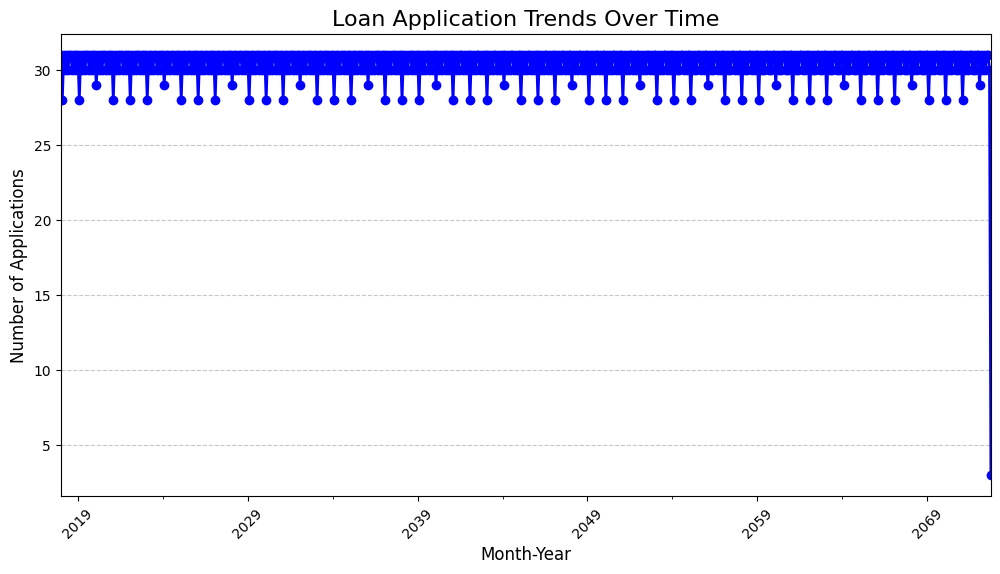

In [63]:
# Ensure 'ApplicationDate' is in datetime format
df['ApplicationDate'] = pd.to_datetime(df['ApplicationDate'], errors='coerce')

# Drop rows with invalid or missing ApplicationDate
df = df.dropna(subset=['ApplicationDate'])

# Time Series Analysis: Analyze trends in ApplicationDate
df['MonthYear'] = df['ApplicationDate'].dt.to_period('M')
monthly_counts = df['MonthYear'].value_counts().sort_index()

# Plotting the trend of applications over time
plt.figure(figsize=(12, 6))
monthly_counts.plot(kind='line', marker='o', color='blue', linewidth=2)
plt.title('Loan Application Trends Over Time', fontsize=16)
plt.xlabel('Month-Year', fontsize=12)
plt.ylabel('Number of Applications', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Distribution Comparison: Numerical Features by LoanApproved

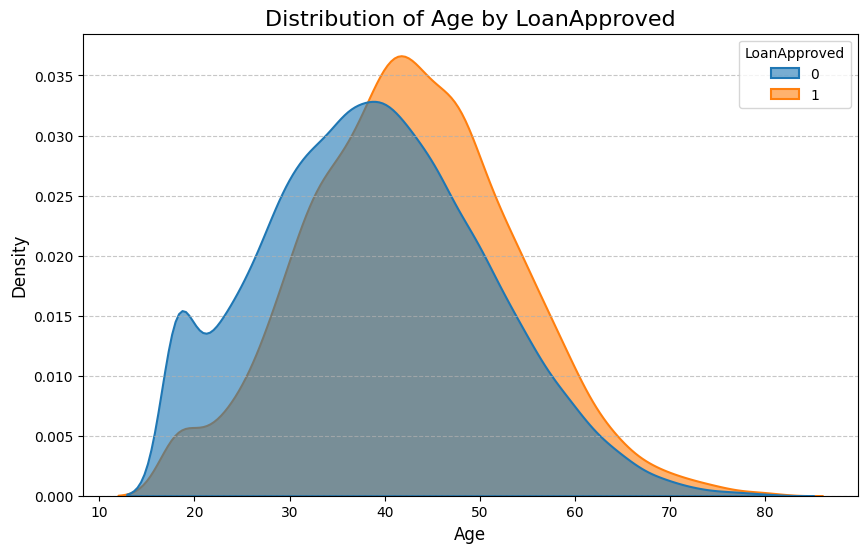

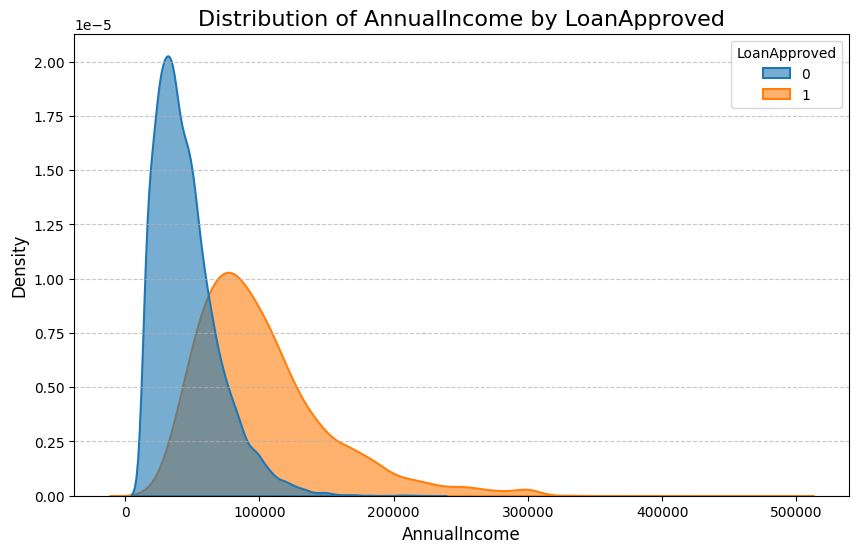

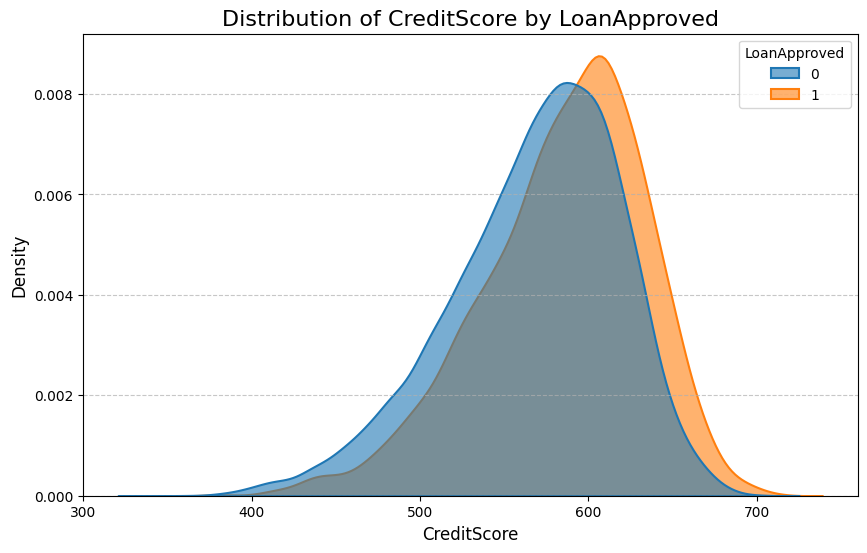

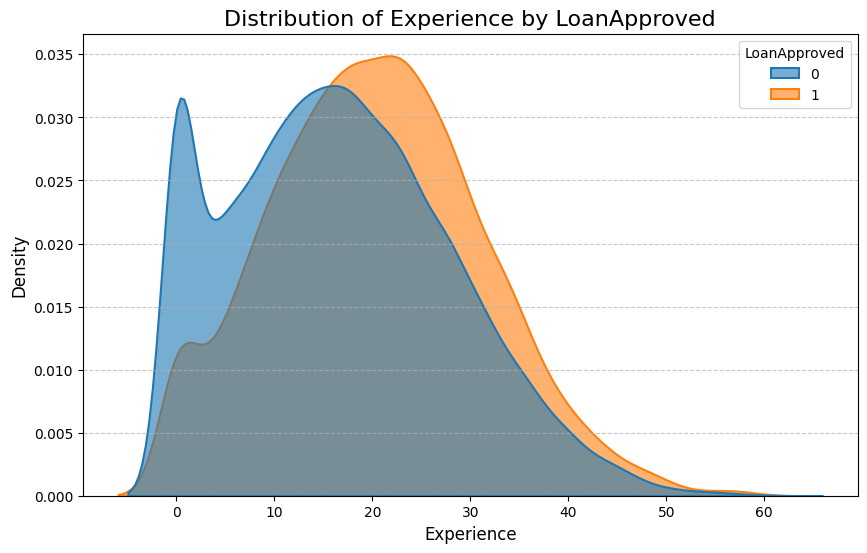

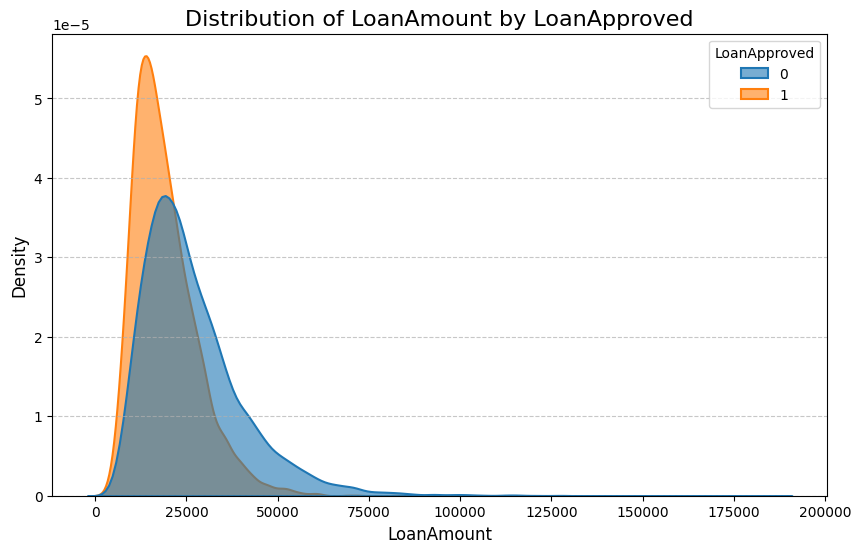

...

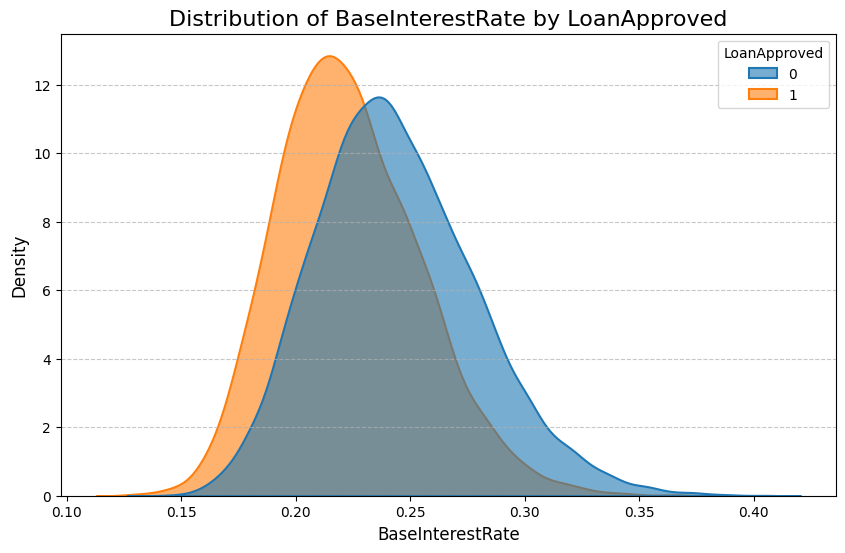

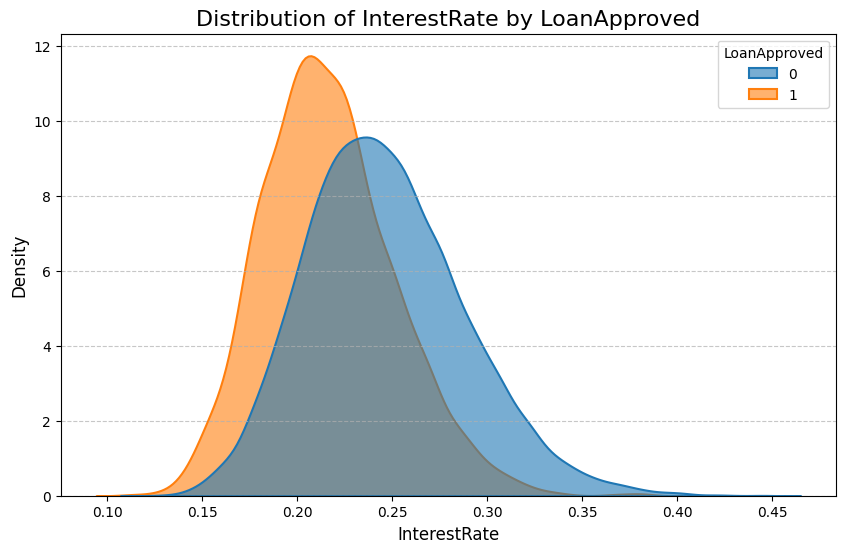

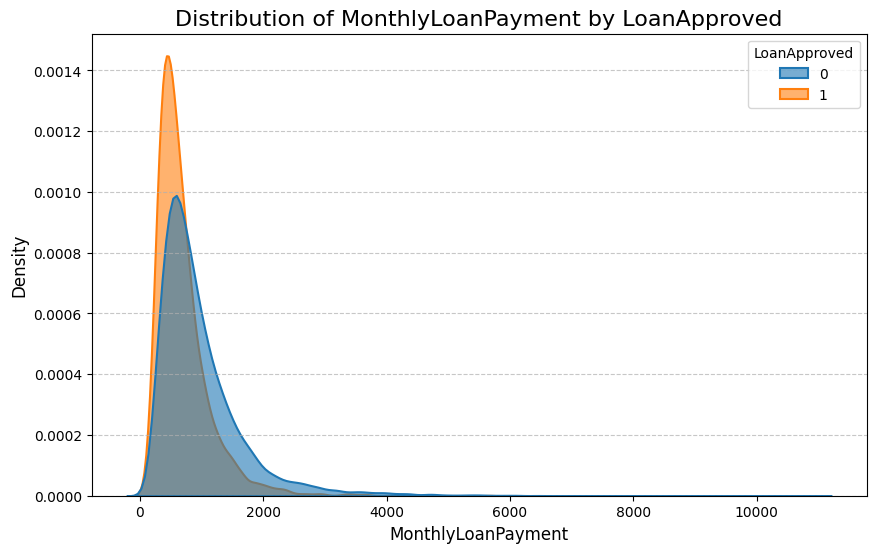

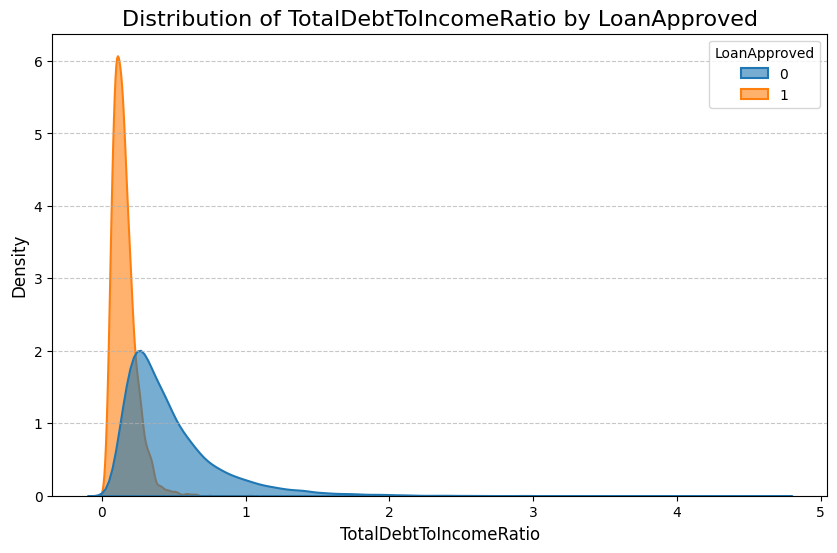

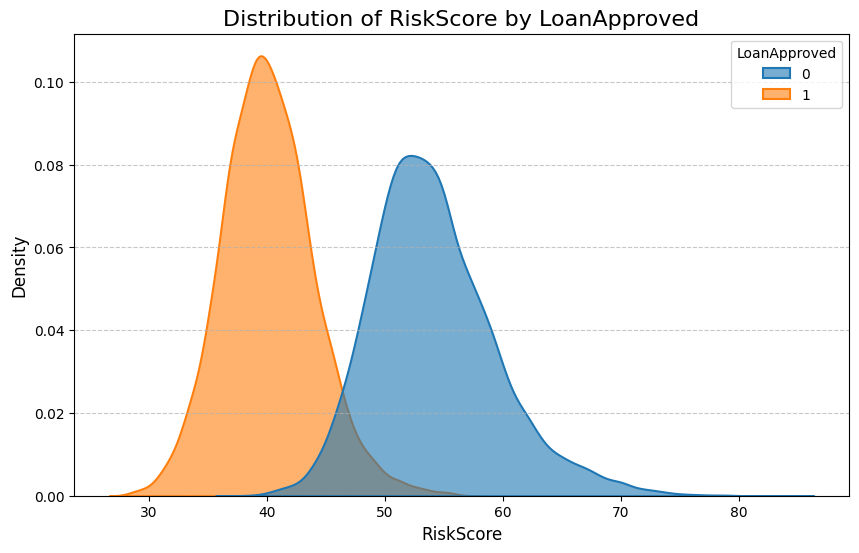

In [64]:
# Identify numerical columns, excluding LoanApproved if necessary
numerical_features = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
if 'LoanApproved' in numerical_features:
    numerical_features.remove('LoanApproved')

# Distribution Comparison
for col in numerical_features:
    plt.figure(figsize=(10, 6))
    sns.kdeplot(data=df, x=col, hue='LoanApproved', fill=True, common_norm=False, alpha=0.6, linewidth=1.5)
    plt.title(f'Distribution of {col} by LoanApproved', fontsize=16)
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Density', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

# Outlier Detection

In [66]:
# Function to detect outliers using the IQR method
def detect_outliers(df, num_cols=None):
    """
    Detect outliers in numerical columns using the IQR method.

    Parameters:
    df (DataFrame): The dataframe containing the data.
    num_cols (list): List of numerical column names. If None, auto-detect numerical columns.

    Returns:
    DataFrame: A summary of outlier counts for each numerical column.
    """
    if num_cols is None:
        num_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

    outlier_summary = {}
    for col in num_cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers = ((df[col] < lower_bound) | (df[col] > upper_bound)).sum()
        outlier_summary[col] = outliers

    return pd.DataFrame.from_dict(outlier_summary, orient='index', columns=['Outlier Count'])

# Run the outlier detection
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
outlier_counts = detect_outliers(df, numerical_cols)

# Display the outlier counts
print(outlier_counts)

                            Outlier Count
Age                                    64
AnnualIncome                          947
CreditScore                           242
Experience                             75
LoanAmount                            746
LoanDuration                            0
NumberOfDependents                      0
MonthlyDebtPayments                   744
CreditCardUtilizationRate             130
NumberOfOpenCreditLines               249
NumberOfCreditInquiries                16
DebtToIncomeRatio                     143
BankruptcyHistory                    1048
PreviousLoanDefaults                 2001
PaymentHistory                        241
LengthOfCreditHistory                   0
SavingsAccountBalance                1592
CheckingAccountBalance               1522
TotalAssets                          1442
TotalLiabilities                     1533
MonthlyIncome                         925
UtilityBillsPaymentHistory            294
JobTenure                         

# Code to Visualize Outliers

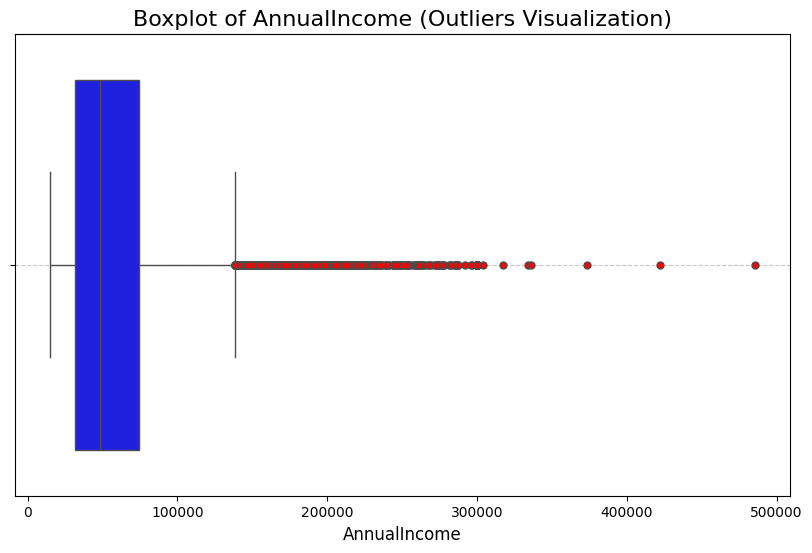

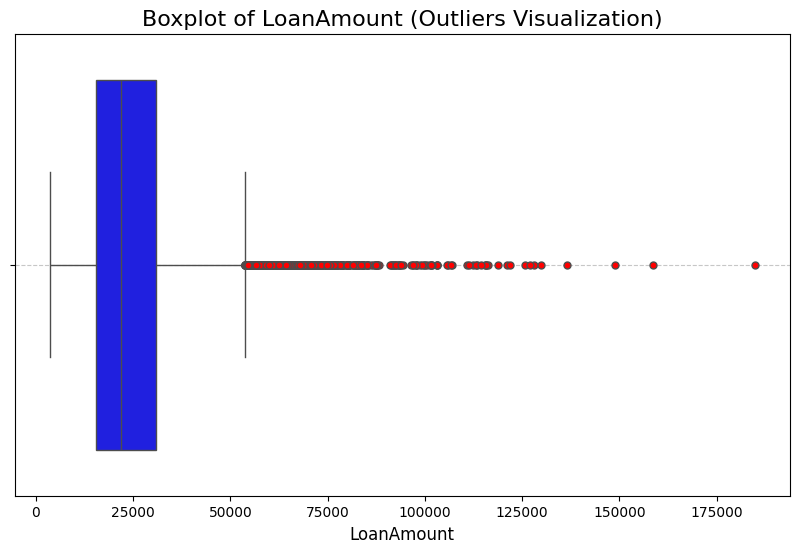

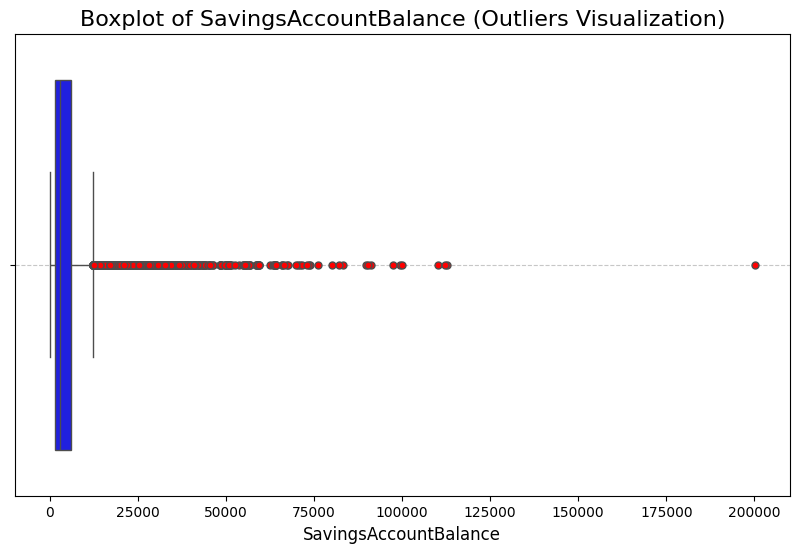

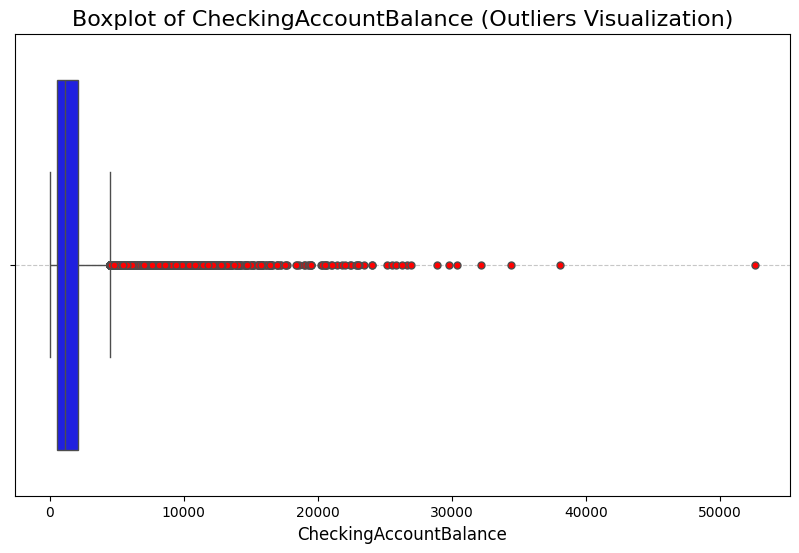

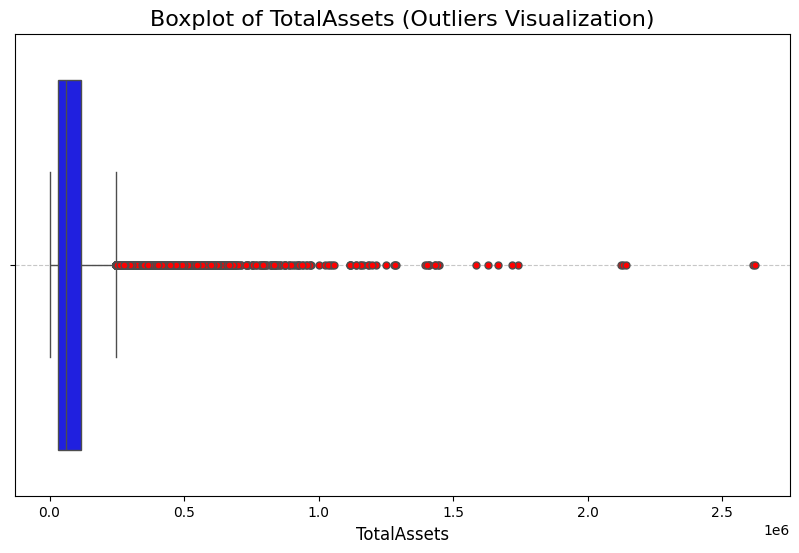

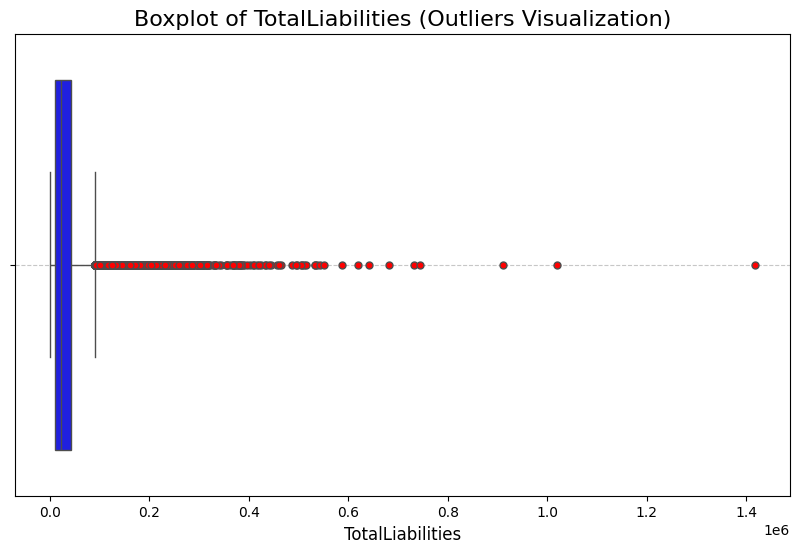

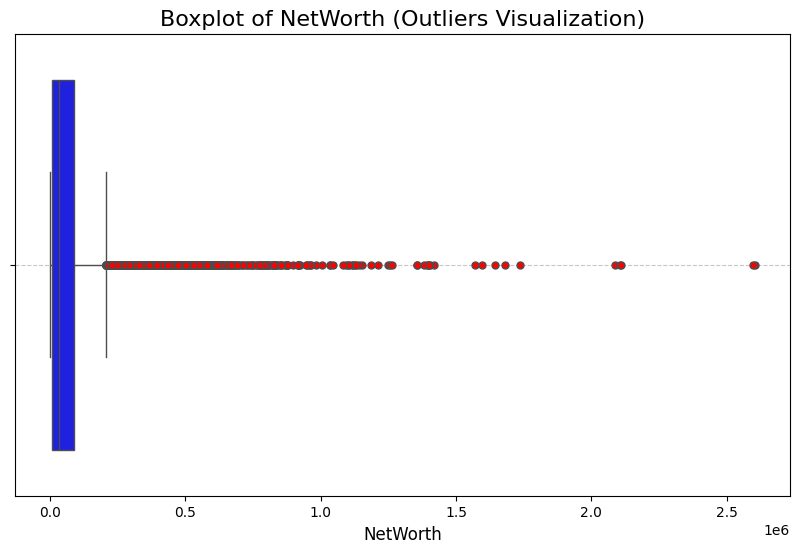

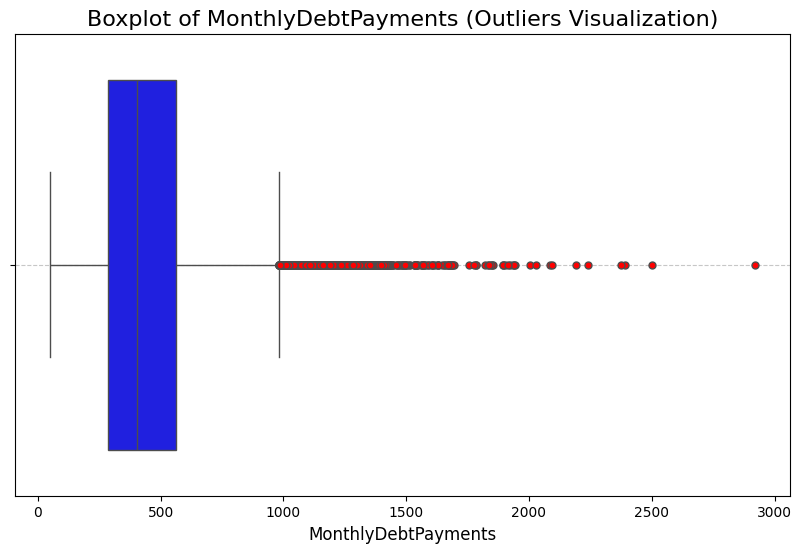

In [67]:
# Visualize outliers with boxplots for selected columns
def plot_outlier_boxplots(df, columns):
    for col in columns:
        plt.figure(figsize=(10, 6))
        sns.boxplot(x=df[col], color='blue', flierprops={"marker": "o", "markerfacecolor": "red", "markersize": 5})
        plt.title(f"Boxplot of {col} (Outliers Visualization)", fontsize=16)
        plt.xlabel(col, fontsize=12)
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.show()

# Columns with high outlier counts for visualization
high_outlier_cols = [
    'AnnualIncome', 'LoanAmount', 'SavingsAccountBalance', 'CheckingAccountBalance',
    'TotalAssets', 'TotalLiabilities', 'NetWorth', 'MonthlyDebtPayments'
]

# Plot boxplots for high outlier columns
plot_outlier_boxplots(df, high_outlier_cols)

# Apply Logarithmic Transformation

In [68]:
# List of columns to transform
skewed_columns = [
    'AnnualIncome', 'LoanAmount', 'SavingsAccountBalance', 'CheckingAccountBalance',
    'TotalAssets', 'TotalLiabilities', 'NetWorth', 'MonthlyDebtPayments'
]

# Apply log transformation to all skewed columns
for col in skewed_columns:
    # Use log1p to handle zeros and avoid errors with log(0)
    df[f'{col}_Log'] = np.log1p(df[col])

# Check the first few rows to ensure transformation is applied
print(df[[f'{col}_Log' for col in skewed_columns]].head())

   AnnualIncome_Log  LoanAmount_Log  SavingsAccountBalance_Log  \
0         10.595359        9.484405                   8.940236   
1         10.589358       10.167619                   8.439880   
2         10.614597        9.777244                   6.787845   
3         11.143093       10.542680                   7.424165   
4         11.545054        9.125327                   7.349874   

   CheckingAccountBalance_Log  TotalAssets_Log  TotalLiabilities_Log  \
0                    7.092574        11.892129              9.861832   
1                    8.149313        10.881908              9.169102   
2                    6.797940        10.133686             11.766598   
3                    7.104965        11.560028              8.588769   
4                    8.513587        12.406177              9.757710   

   NetWorth_Log  MonthlyDebtPayments_Log  
0     11.751383                 5.214936  
1     10.683042                 6.208590  
2      8.557567                 6.805723 

# Visualize the Changes

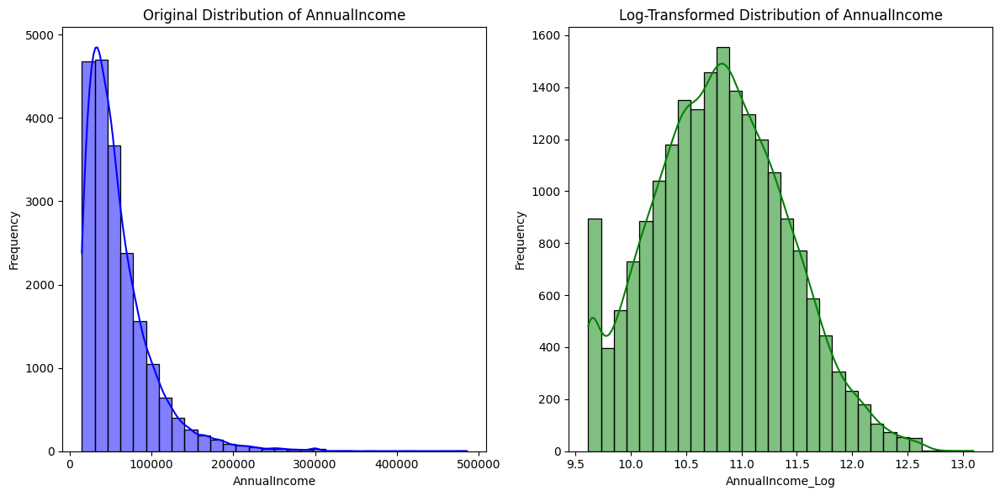

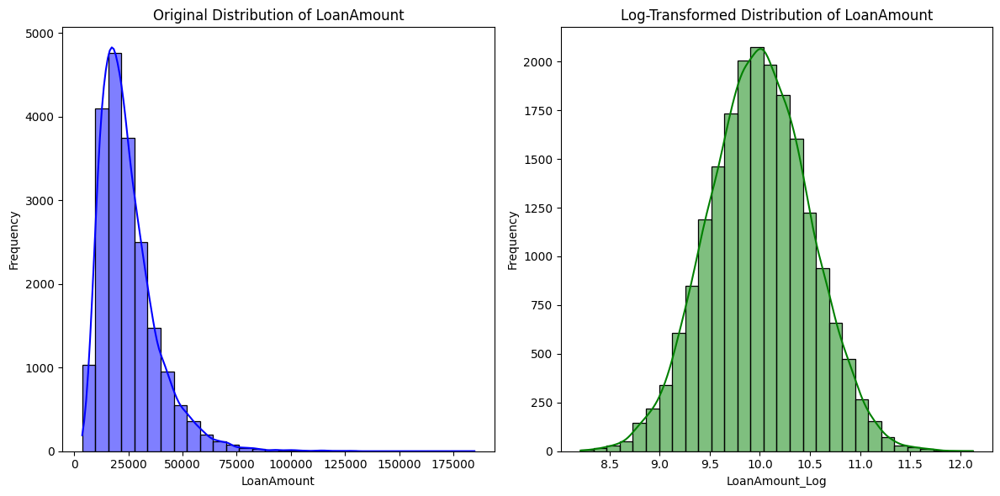

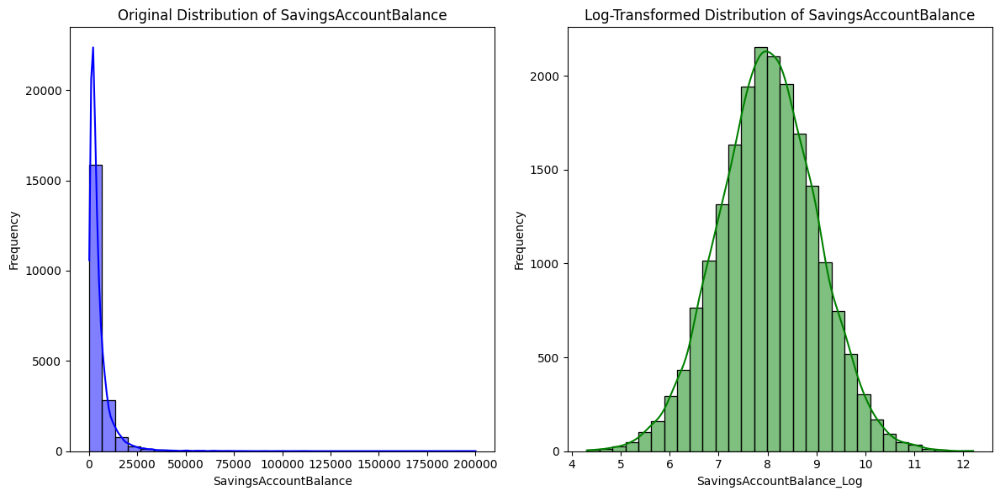

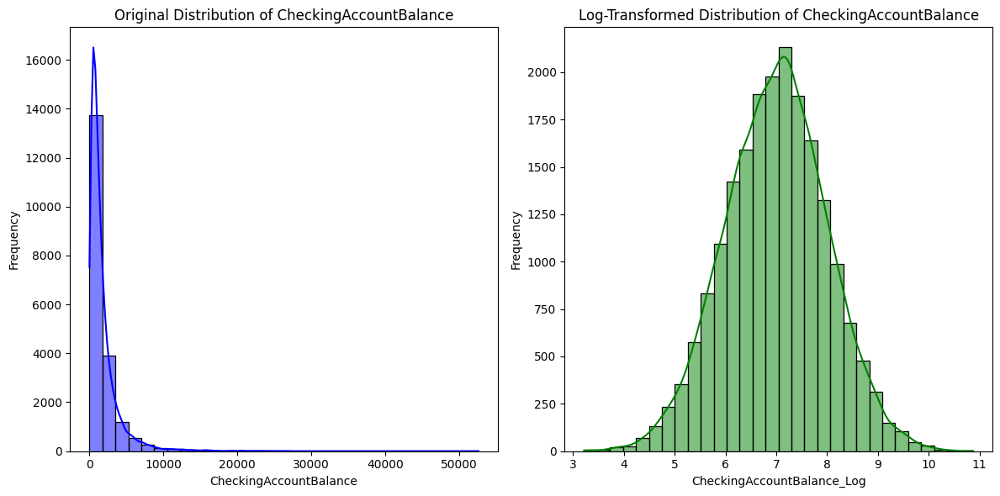

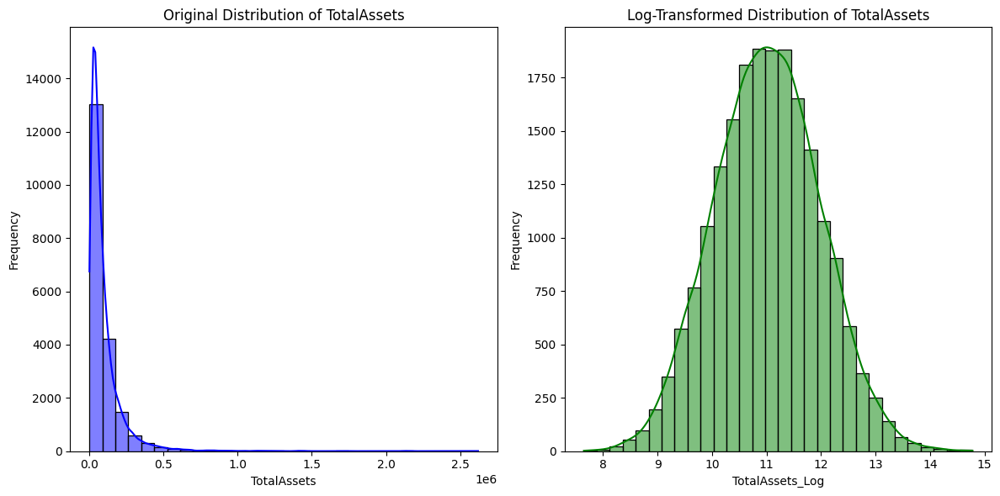

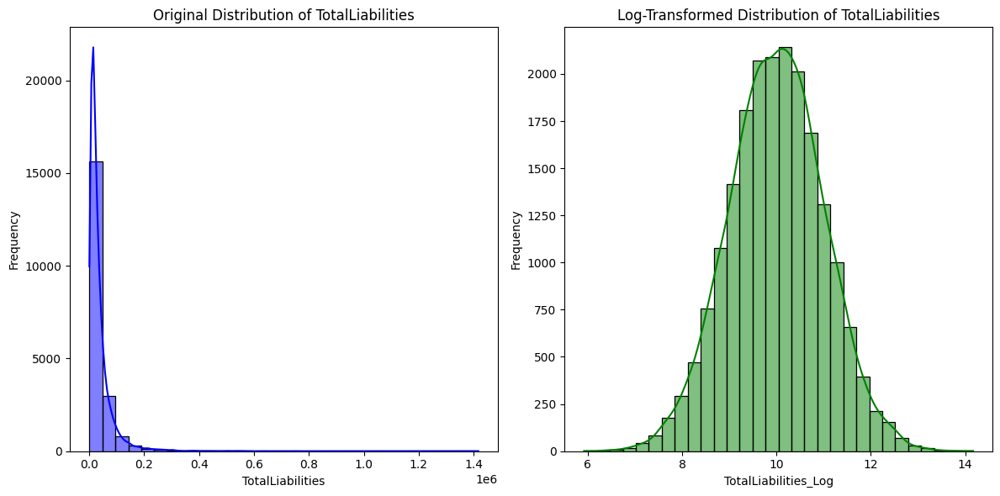

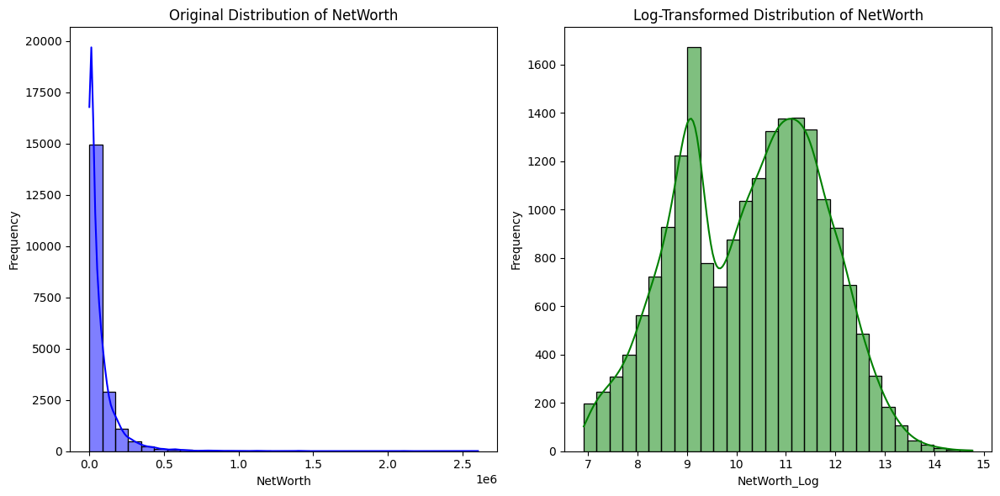

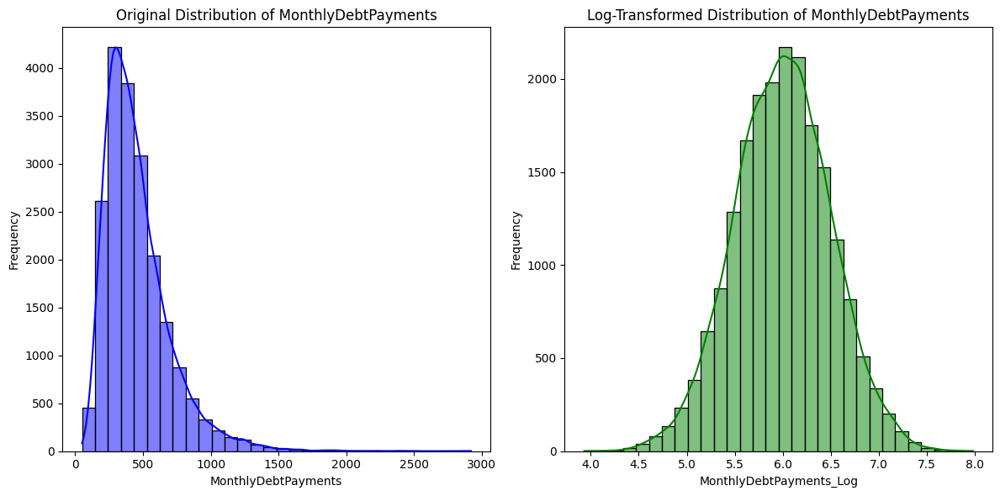

In [69]:
# Plot original and transformed distributions side by side
for col in skewed_columns:
    plt.figure(figsize=(12, 6))

    # Original Distribution
    plt.subplot(1, 2, 1)
    sns.histplot(df[col], kde=True, color='blue', bins=30)
    plt.title(f'Original Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

    # Transformed Distribution
    plt.subplot(1, 2, 2)
    sns.histplot(df[f'{col}_Log'], kde=True, color='green', bins=30)
    plt.title(f'Log-Transformed Distribution of {col}')
    plt.xlabel(f'{col}_Log')
    plt.ylabel('Frequency')

    plt.tight_layout()
    plt.show()

# Boxplots After Transformation

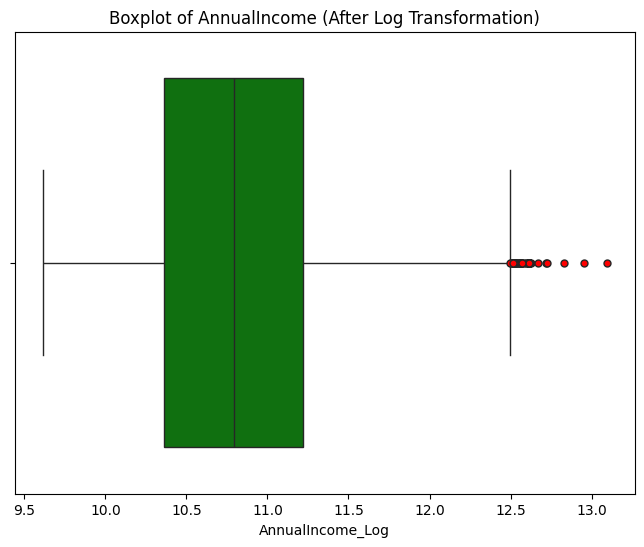

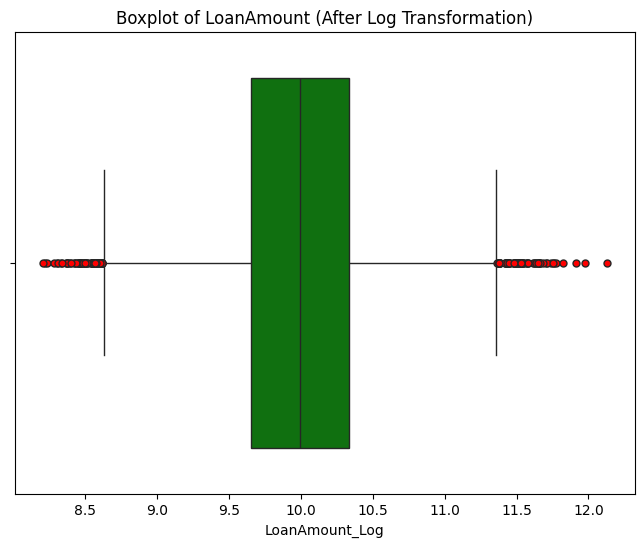

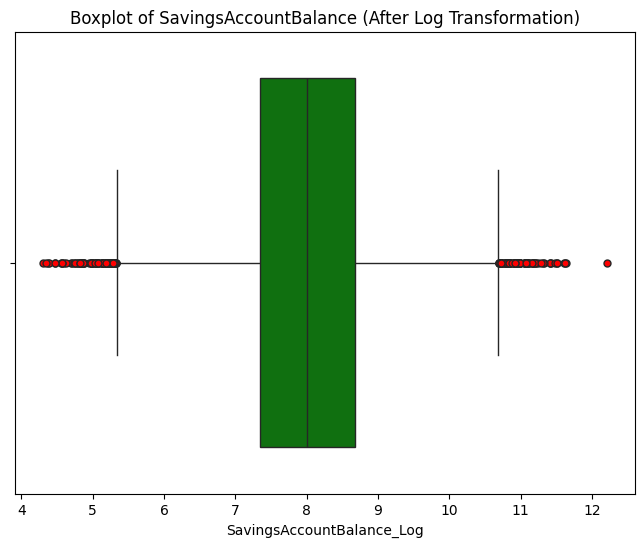

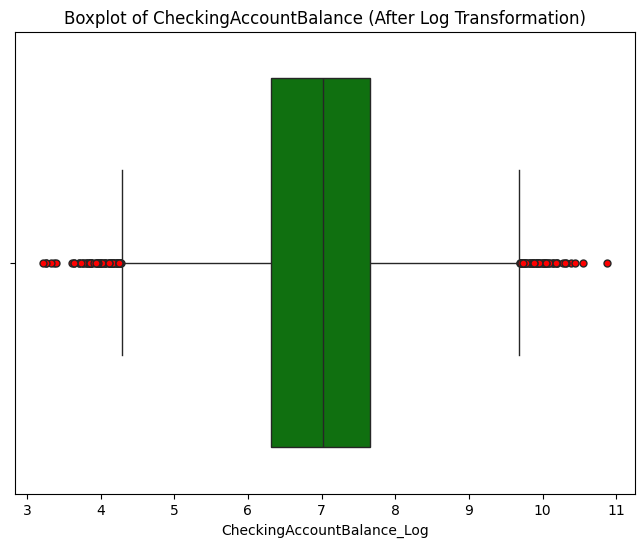

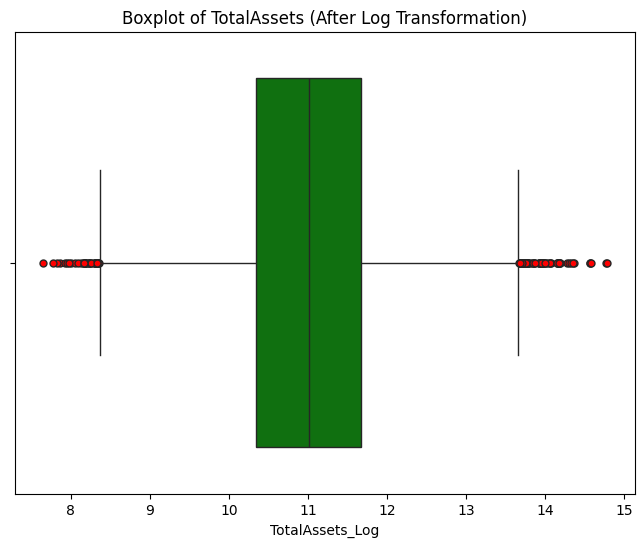

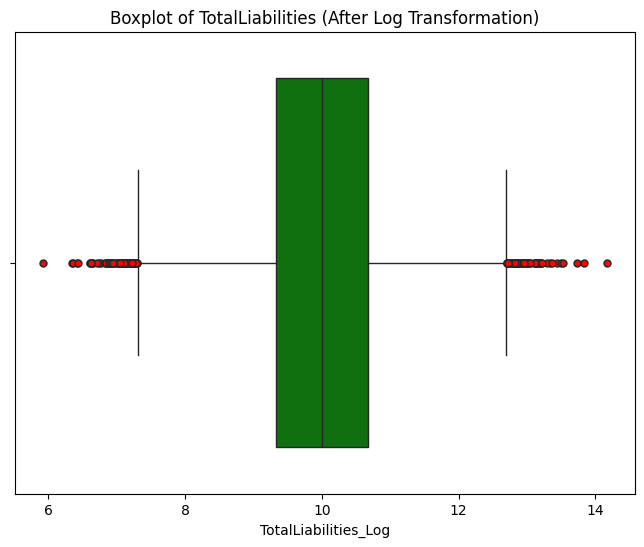

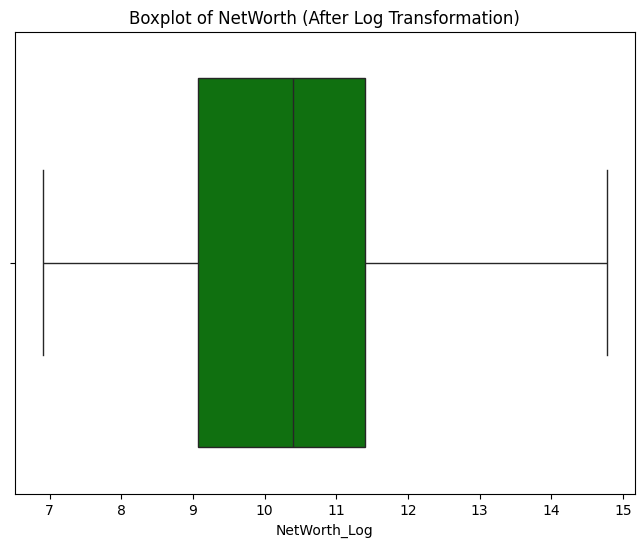

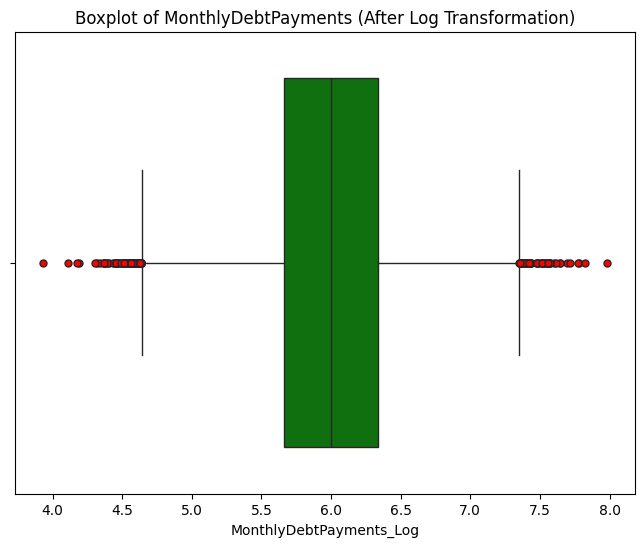

In [70]:
# Plot boxplots for transformed columns
for col in skewed_columns:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=df[f'{col}_Log'], color='green', flierprops={"marker": "o", "markerfacecolor": "red", "markersize": 5})
    plt.title(f"Boxplot of {col} (After Log Transformation)")
    plt.xlabel(f'{col}_Log')
    plt.show()

# Winsorization

In [71]:
from scipy.stats.mstats import winsorize

# Winsorize each column in the skewed_columns list
def apply_winsorization(df, columns, lower_quantile=0.01, upper_quantile=0.99):
    """
    Apply Winsorization to reduce extreme outliers for specified columns.

    Parameters:
    df (DataFrame): The dataset.
    columns (list): List of columns to Winsorize.
    lower_quantile (float): Lower quantile to cap.
    upper_quantile (float): Upper quantile to cap.

    Returns:
    DataFrame: The dataset with Winsorized columns.
    """
    for col in columns:
        lower_limit = df[col].quantile(lower_quantile)
        upper_limit = df[col].quantile(upper_quantile)
        df[col] = np.clip(df[col], lower_limit, upper_limit)
    return df

# Apply Winsorization to the skewed columns
df = apply_winsorization(df, skewed_columns)

# Check updated summary statistics to confirm Winsorization
print(df[skewed_columns].describe())

        AnnualIncome    LoanAmount  SavingsAccountBalance  \
count   20000.000000  20000.000000           20000.000000   
mean    58729.915450  24736.049350            4778.655350   
std     38266.044286  12662.043265            5291.093748   
min     15000.000000   6779.990000             279.990000   
25%     31679.000000  15575.000000            1541.750000   
50%     48566.000000  21914.500000            2986.000000   
75%     74391.000000  30835.000000            5873.250000   
max    211041.330000  70130.080000           30896.340000   

       CheckingAccountBalance    TotalAssets  TotalLiabilities       NetWorth  \
count            20000.000000   20000.000000       20000.00000   20000.000000   
mean              1735.756000   94188.507300       35252.28620   69550.044100   
std               1908.215734   99637.388645       39279.36641   96586.204168   
min                105.000000    7042.000000        2087.99000    1308.960000   
25%                551.000000   31180.250000 

# Visualize Boxplots After Winsorization

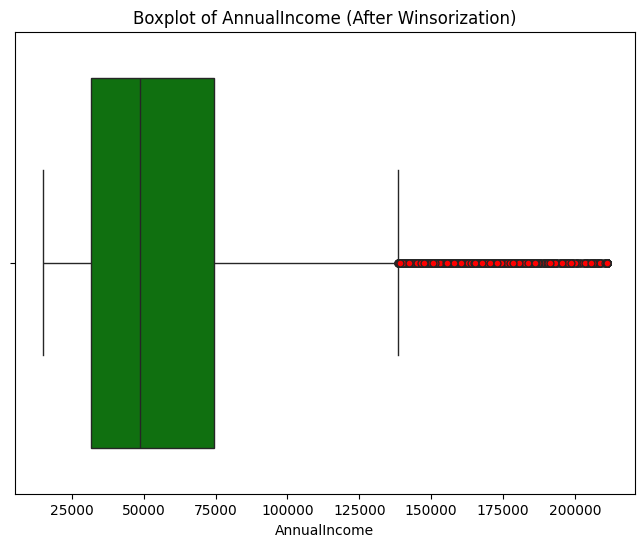

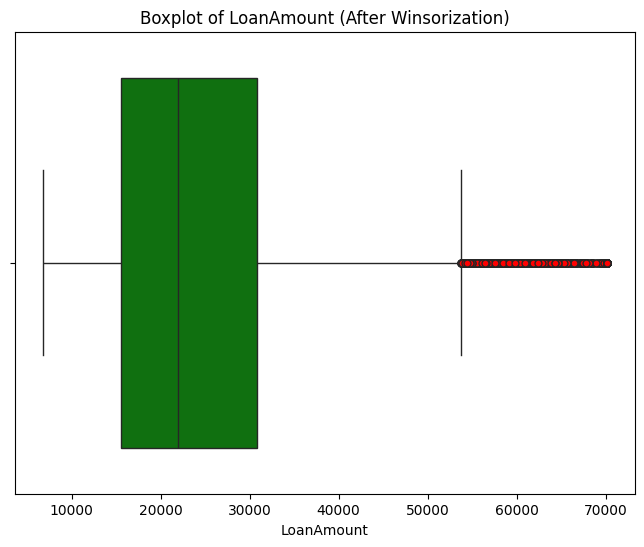

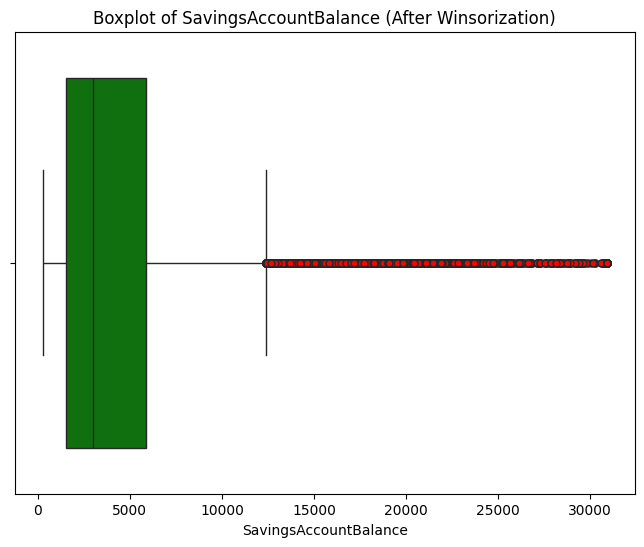

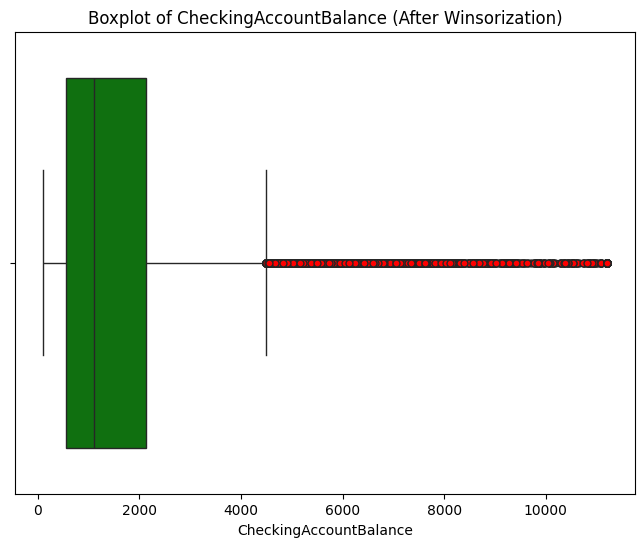

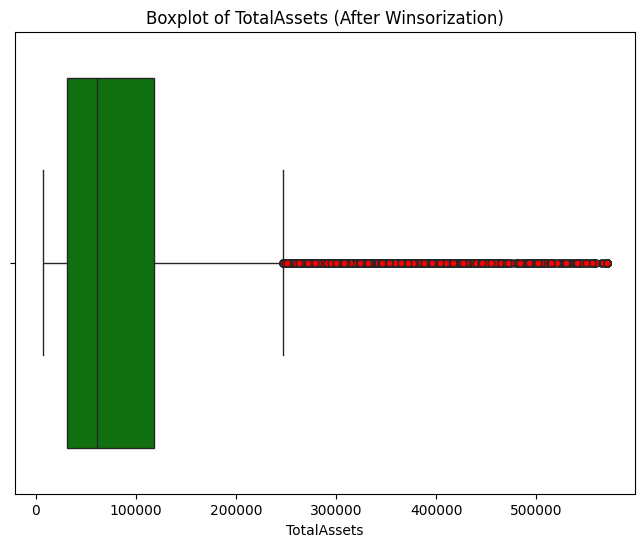

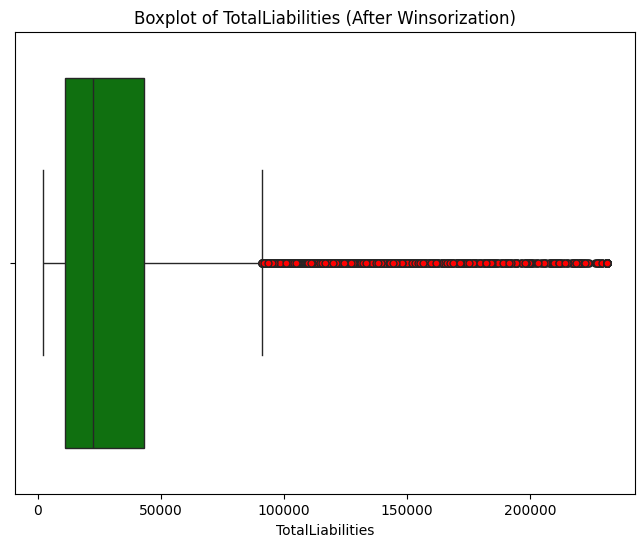

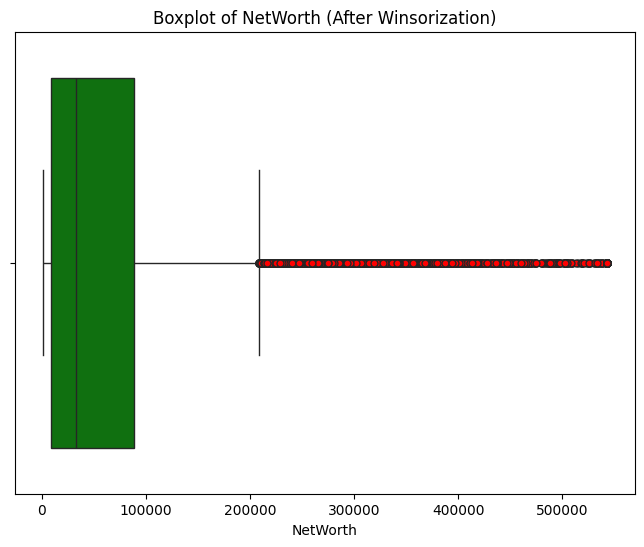

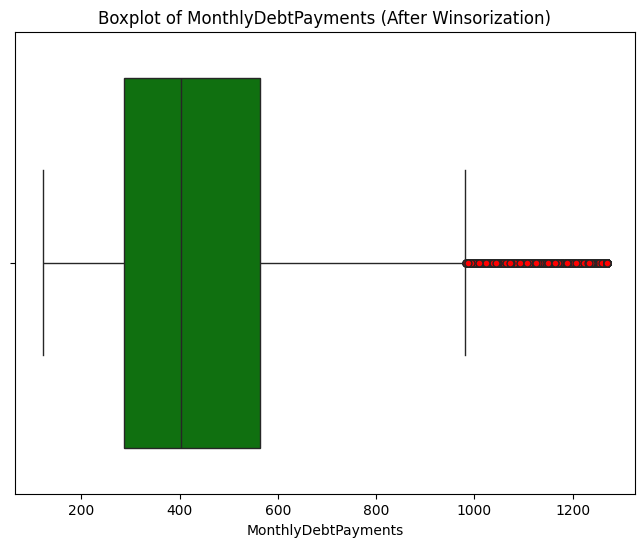

In [72]:
# Plot boxplots after Winsorization
for col in skewed_columns:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=df[col], color='green', flierprops={"marker": "o", "markerfacecolor": "red", "markersize": 5})
    plt.title(f"Boxplot of {col} (After Winsorization)")
    plt.xlabel(col)
    plt.show()

# Code to Apply Log Transformation Post-Winsorization

In [73]:
# Apply log transformation to the Winsorized data
for col in skewed_columns:
    df[f'{col}_Log'] = np.log1p(df[col])  # log1p handles zero values safely

# Visualize Distribution Post-Log Transformation

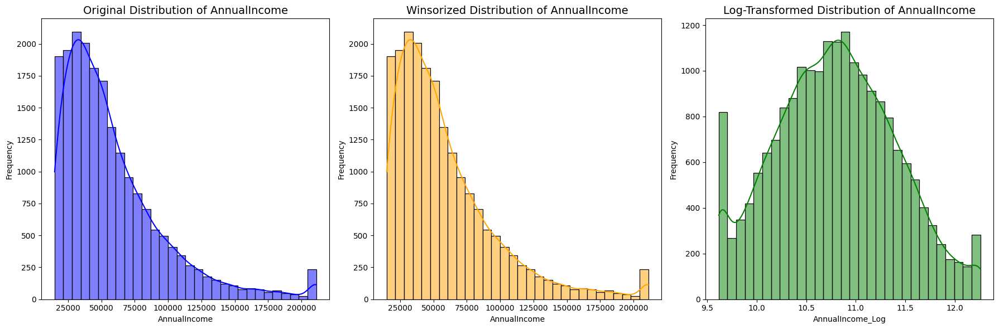

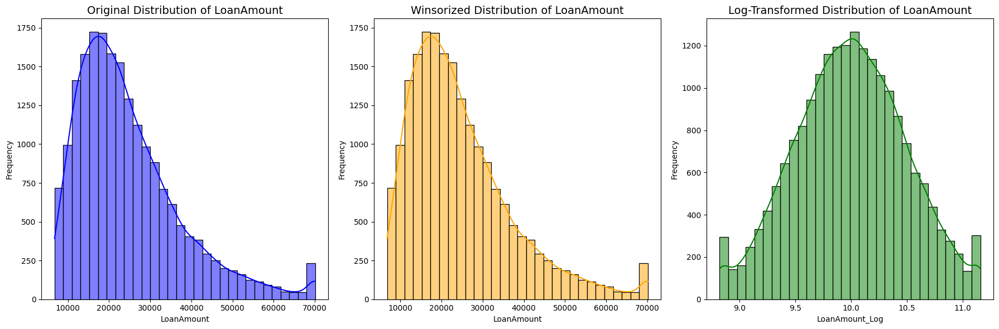

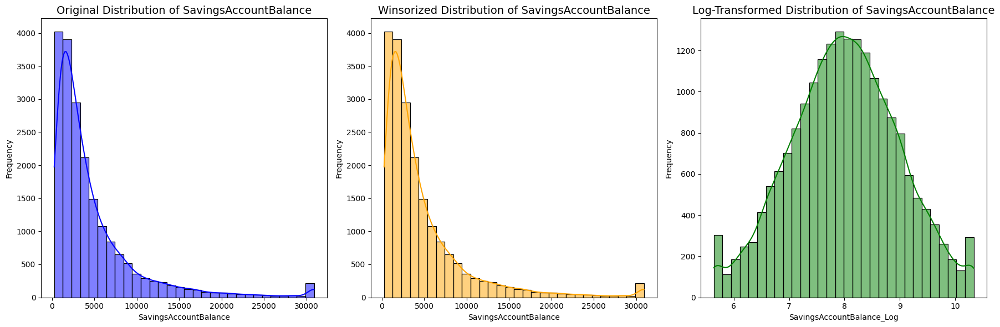

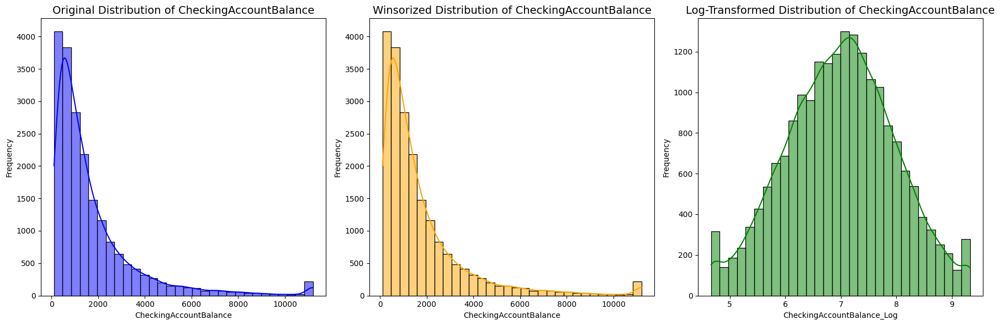

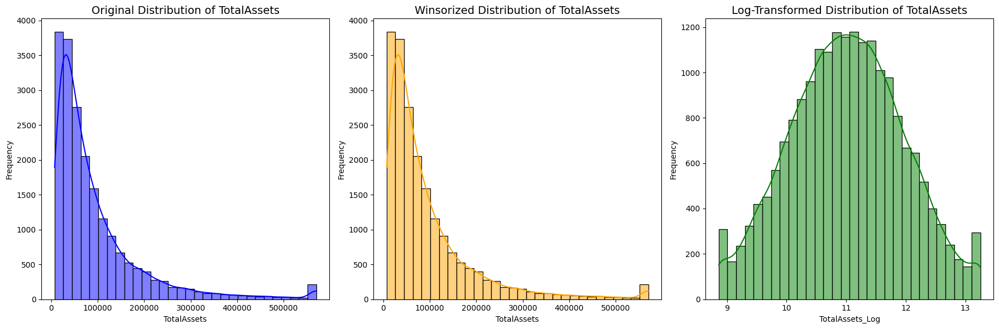

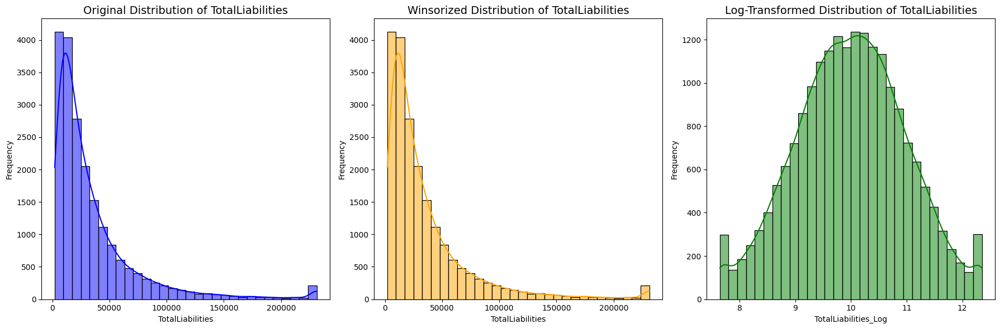

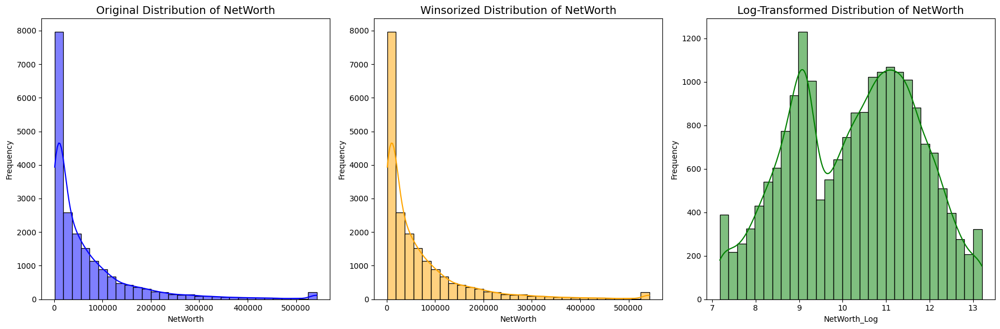

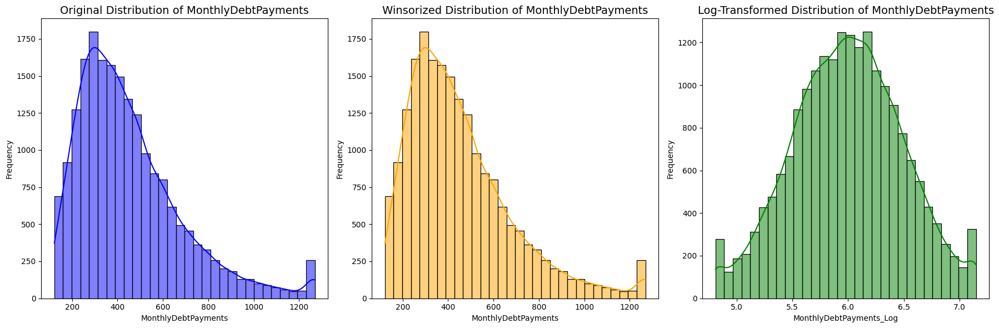

In [74]:
# Compare original, Winsorized, and log-transformed distributions
for col in skewed_columns:
    plt.figure(figsize=(18, 6))

    # Original Distribution
    plt.subplot(1, 3, 1)
    sns.histplot(df[col], kde=True, color='blue', bins=30)
    plt.title(f'Original Distribution of {col}', fontsize=14)
    plt.xlabel(col)
    plt.ylabel('Frequency')

    # Winsorized Distribution
    plt.subplot(1, 3, 2)
    sns.histplot(df[col], kde=True, color='orange', bins=30)
    plt.title(f'Winsorized Distribution of {col}', fontsize=14)
    plt.xlabel(col)
    plt.ylabel('Frequency')

    # Log-Transformed Distribution
    plt.subplot(1, 3, 3)
    sns.histplot(df[f'{col}_Log'], kde=True, color='green', bins=30)
    plt.title(f'Log-Transformed Distribution of {col}', fontsize=14)
    plt.xlabel(f'{col}_Log')
    plt.ylabel('Frequency')

    plt.tight_layout()
    plt.show()

# Visualize Boxplots Post-Log Transformation

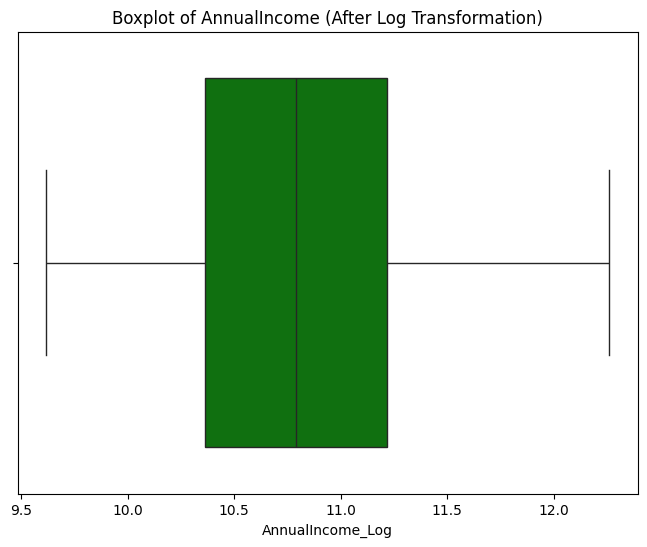

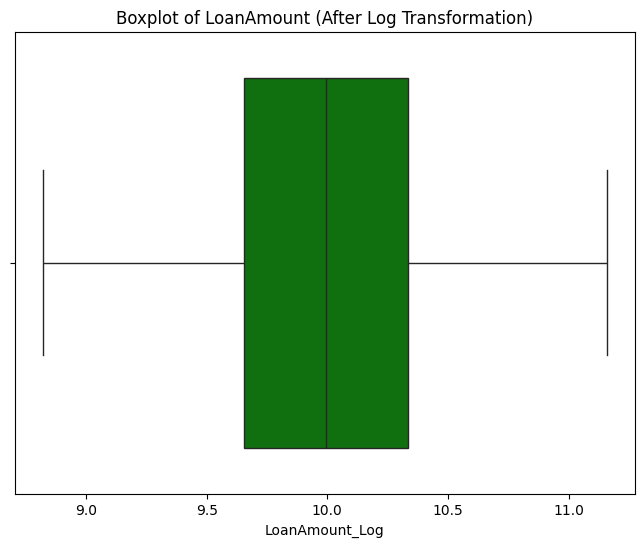

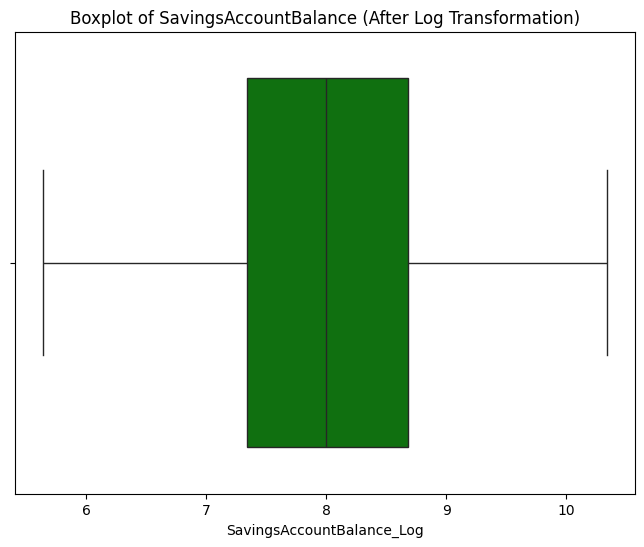

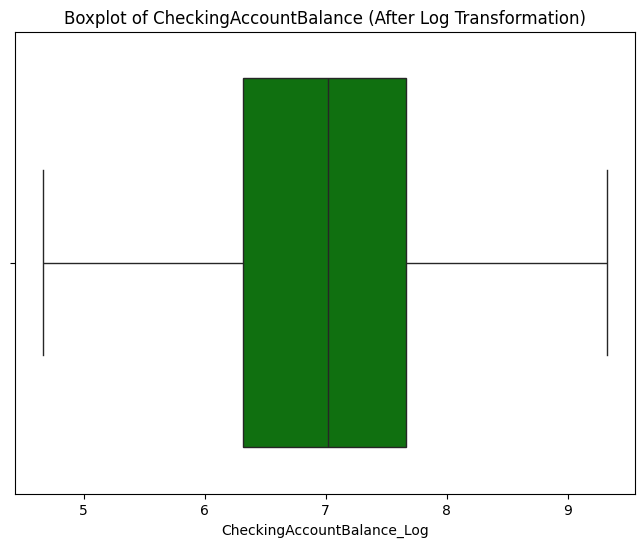

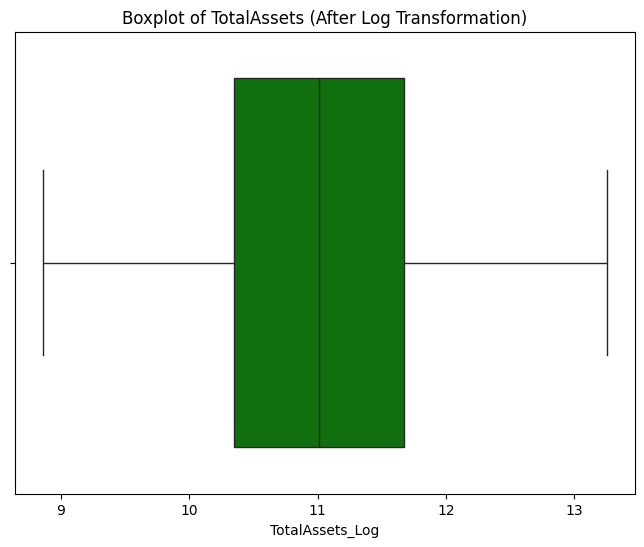

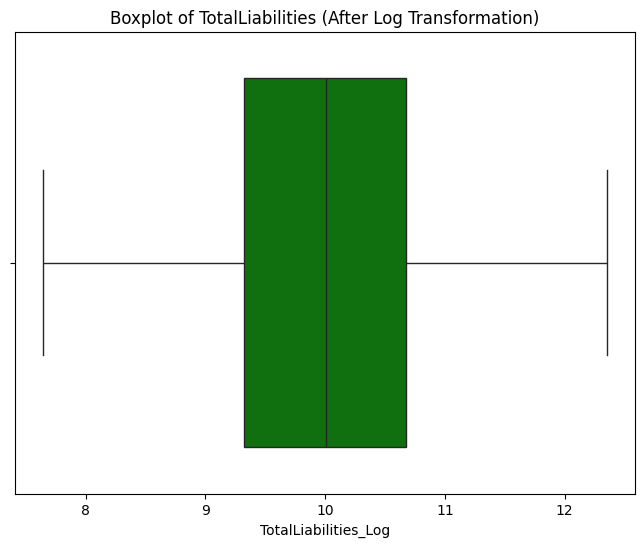

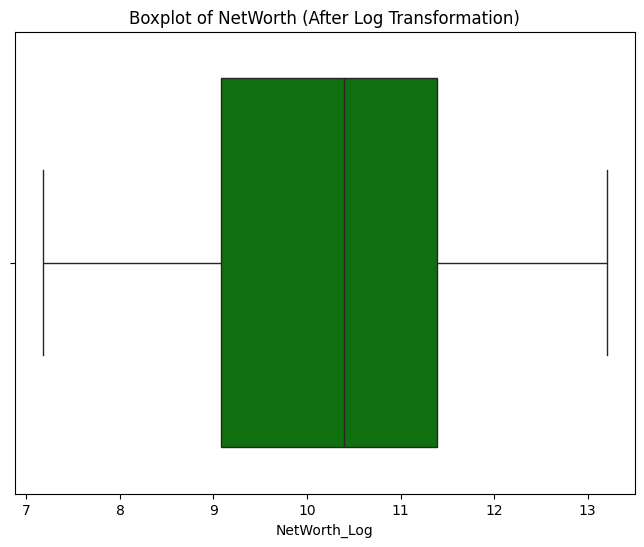

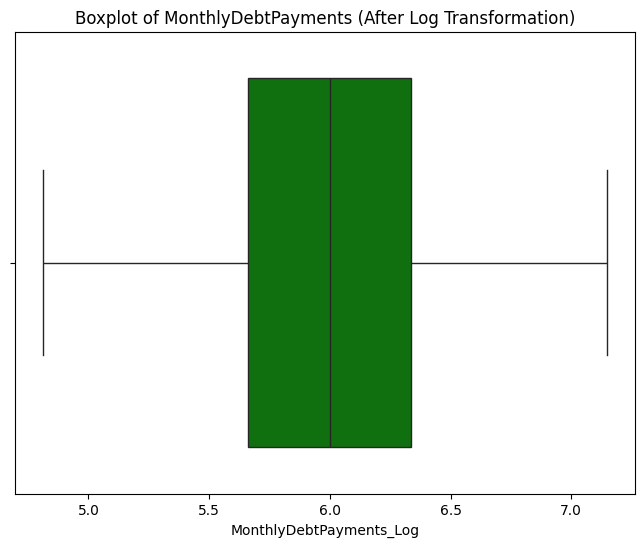

In [75]:
# Boxplots for log-transformed columns
for col in skewed_columns:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=df[f'{col}_Log'], color='green', flierprops={"marker": "o", "markerfacecolor": "red", "markersize": 5})
    plt.title(f"Boxplot of {col} (After Log Transformation)")
    plt.xlabel(f'{col}_Log')
    plt.show()

# Replace the original columns with the final transformed versions if satisfied? Yes

In [76]:
for col in skewed_columns:
    df[col] = df[f'{col}_Log']
    df.drop(columns=[f'{col}_Log'], inplace=True)

# Feature Engineering:

Create Derived Features: Generate new features that could provide additional predictive power. Examples:
DebtToIncomeRatio = MonthlyDebtPayments / MonthlyIncome
SavingsToIncomeRatio = SavingsAccountBalance / AnnualIncome
NetAssetValue = TotalAssets - TotalLiabilities
Encode Categorical Variables:
Apply one-hot encoding or label encoding for categorical columns like MaritalStatus, EmploymentStatus, and LoanPurpose.

# Train-Test Split

Split the dataset into training and testing sets.

In [80]:
# Define target variable and features
target = 'LoanApproved'
features = [col for col in df.columns if col not in [target, 'ApplicationDate']]  # Exclude non-numeric columns

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(df[features], df[target], test_size=0.2, random_state=42)

# Remove non-numeric features (if any) and ensure scaling only applies to numeric columns
numeric_features = X_train.select_dtypes(include=['int64', 'float64']).columns

# Scale numeric features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train[numeric_features])
X_test_scaled = scaler.transform(X_test[numeric_features])
print(X_train_scaled)

[[ 0.44626865 -1.93497279  0.94883443 ... -0.39159836  1.54032525
  -0.23786594]
 [-1.27453396  0.0422476  -1.68545498 ... -0.37263925 -0.43508759
   1.31040446]
 [ 0.96250943 -0.36487229  0.08384388 ... -0.63424262 -0.30774968
   0.14920166]
 ...
 [-0.75829318 -0.01715911 -1.07602982 ... -0.87413108 -0.61329413
  -1.08941467]
 [ 0.18814825 -1.90614431  0.67361016 ... -0.9215793   0.15555586
   0.92333686]
 [-0.2420524  -0.1192296   1.16508207 ...  1.75791374  0.68707069
   0.40724673]]


# Feature Scaling:

Standardize the numerical features to ensure they’re on a comparable scale.

In [82]:
from sklearn.preprocessing import StandardScaler

# Select only numeric features for scaling
numeric_features = X_train.select_dtypes(include=['number']).columns

# Instantiate StandardScaler
scaler = StandardScaler()

# Fit and transform on training data (numeric features only)
X_train_scaled = scaler.fit_transform(X_train[numeric_features])

# Transform test data (numeric features only)
X_test_scaled = scaler.transform(X_test[numeric_features])

#Model Building:

Start building machine learning models. Consider the following:

Logistic Regression: For a baseline model.
Gradient Boosting (e.g., XGBoost, LightGBM): For enhanced predictive performance.
Random Forest: For handling non-linear relationships.
Example with Gradient Boosting:

In [83]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Train the model
model = GradientBoostingClassifier(random_state=42)
model.fit(X_train_scaled, y_train)

# Predictions
y_pred = model.predict(X_test_scaled)

# Evaluation
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      2983
           1       1.00      1.00      1.00      1017

    accuracy                           1.00      4000
   macro avg       1.00      1.00      1.00      4000
weighted avg       1.00      1.00      1.00      4000

Confusion Matrix:
 [[2980    3]
 [   3 1014]]


# Cross-Validation:

Perform k-fold cross-validation to ensure the model generalizes well to unseen data.

In [84]:
from sklearn.model_selection import cross_val_score

cv_scores = cross_val_score(model, X_train_scaled, y_train, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Accuracy:", cv_scores.mean())

Cross-Validation Scores: [0.9978125 0.998125  0.998125  0.9984375 0.9965625]
Mean CV Accuracy: 0.9978125


The cross-validation results confirm that your model is performing consistently across different folds, with an average accuracy of 99.78%. This indicates that the model generalizes well and is not overfitting to the training data. The minor variations in accuracy across folds are expected and within an acceptable range.

# Feature Importance Analysis:

Identify the most influential features driving the predictions. This will help ensure the model is leveraging meaningful variables and not relying on potential data leakage.

                       Feature  Importance
28                   RiskScore    0.914764
27      TotalDebtToIncomeRatio    0.049749
11           DebtToIncomeRatio    0.011503
20               MonthlyIncome    0.007974
25                InterestRate    0.005622
12           BankruptcyHistory    0.004673
2                  CreditScore    0.002210
4                   LoanAmount    0.001637
13        PreviousLoanDefaults    0.000469
23                    NetWorth    0.000436
5                 LoanDuration    0.000320
8    CreditCardUtilizationRate    0.000187
24            BaseInterestRate    0.000110
14              PaymentHistory    0.000082
21  UtilityBillsPaymentHistory    0.000063
26          MonthlyLoanPayment    0.000046
16       SavingsAccountBalance    0.000039
3                   Experience    0.000033
0                          Age    0.000027
18                 TotalAssets    0.000026
15       LengthOfCreditHistory    0.000012
6           NumberOfDependents    0.000010
10     Numb

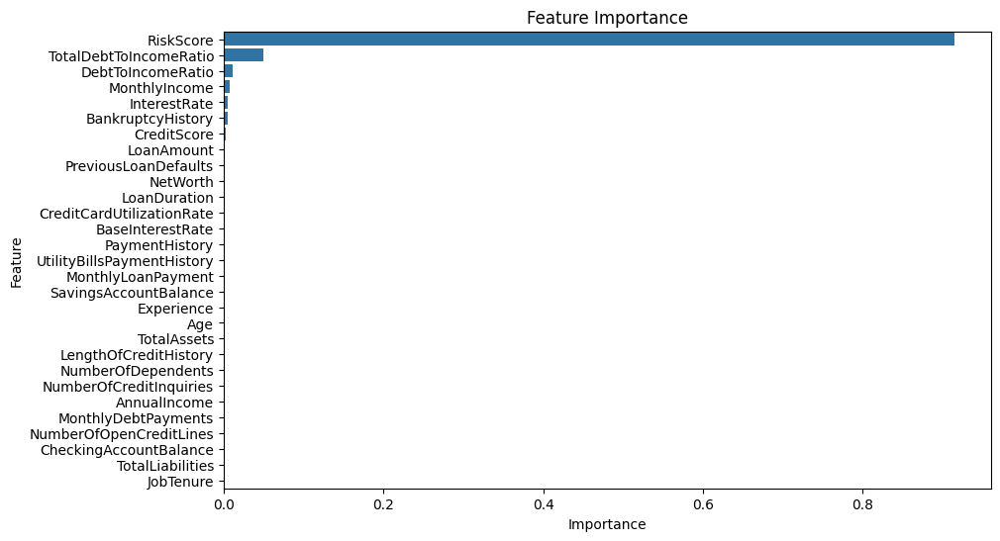

In [85]:
feature_importances = model.feature_importances_
importance_df = pd.DataFrame({
    'Feature': numeric_features,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

print(importance_df)

# Visualize Feature Importance
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

Key Insights:
Dominant Feature:

RiskScore has an overwhelming importance (91.5%), suggesting that this feature is the primary driver of loan approval predictions.
Moderately Important Features:

TotalDebtToIncomeRatio (4.97%)
DebtToIncomeRatio (1.15%)
MonthlyIncome (0.8%)
InterestRate (0.56%)
These features play a secondary role but still contribute meaningfully to predictions.
Negligible Features:

Several features, such as AnnualIncome, MonthlyDebtPayments, CheckingAccountBalance, and JobTenure, have an importance of zero.
These could be candidates for removal if you want to simplify the model.

# investigate RiskScore:

Given its dominance, confirm that RiskScore is not overly correlated with the target (LoanApproved). If it is, this could indicate potential data leakage.

In [87]:
correlation = df['RiskScore'].corr(df['LoanApproved'])
print(f"Correlation between RiskScore and LoanApproved: {correlation}")

Correlation between RiskScore and LoanApproved: -0.7661374114914389


The correlation between RiskScore and LoanApproved is -0.77, which is quite strong and negative. This suggests that as the RiskScore increases (indicating higher risk), the likelihood of loan approval decreases.

Key Observations:
High Correlation:

This strong correlation may partially explain why RiskScore dominates feature importance in the model. It directly aligns with the target (LoanApproved), making it a primary predictor.
However, this does not necessarily indicate data leakage unless RiskScore is derived from the target variable itself or from features highly correlated with it.
Potential Concern:

If RiskScore is manually engineered or highly dependent on other features, its dominance could overshadow other potentially useful predictors.

# Evaluate ROC-AUC and Precision-Recall Curves:

These metrics provide deeper insights into model performance, especially for imbalanced data.

ROC-AUC Score: 0.9999887926041735


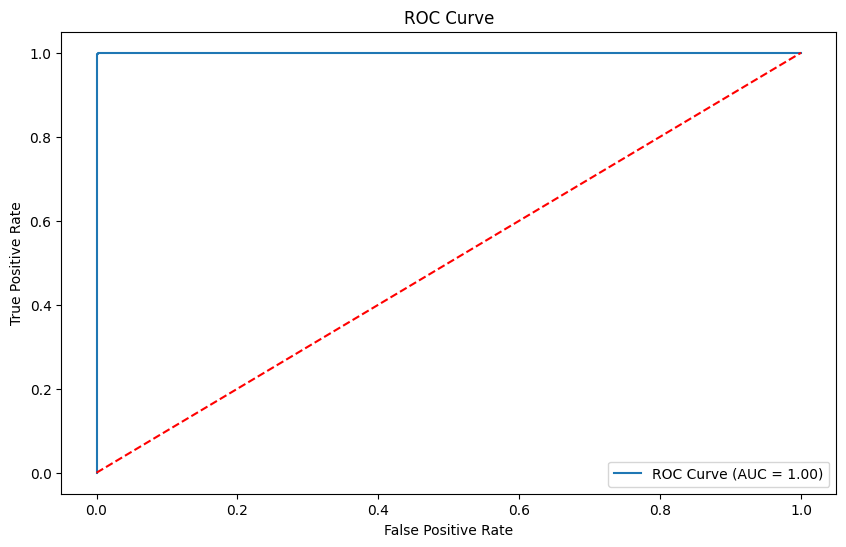

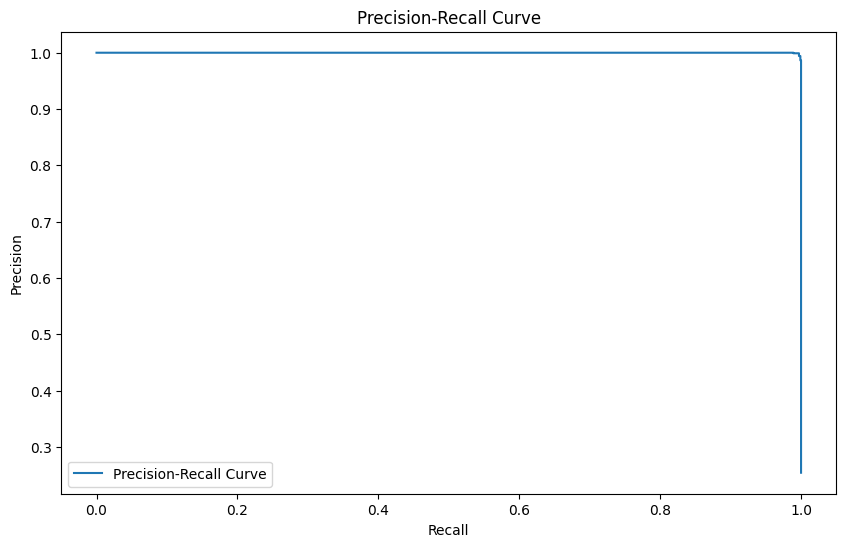

In [86]:
from sklearn.metrics import roc_curve, roc_auc_score, precision_recall_curve

# ROC-AUC
y_pred_prob = model.predict_proba(X_test_scaled)[:, 1]
roc_auc = roc_auc_score(y_test, y_pred_prob)
print("ROC-AUC Score:", roc_auc)

fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='red')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_test, y_pred_prob)
plt.figure(figsize=(10, 6))
plt.plot(recall, precision, label='Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.show()

The ROC Curve and Precision-Recall Curve confirm that the model is performing exceptionally well. The nearly perfect ROC-AUC score of 0.9999 and the Precision-Recall curve demonstrate that the model can accurately differentiate between classes and maintain high precision and recall even with imbalanced classes.

Next Steps:
Validate on a Separate Validation Set:

If not already done, test the model on a completely unseen dataset to ensure its generalizability.
Explainability and Feature Contribution:

Use feature importance or SHAP to verify that the model is making logical predictions and to interpret which features are most influential.
Save the Model:

Save the trained model and preprocessing steps for future use or deployment.
python
Copy code
import joblib
joblib.dump(model_no_risk, 'final_model.pkl')
joblib.dump(scaler, 'scaler.pkl')  # If scaling was used
Deploy or Integrate:

Package the model for deployment in a real-world application, such as a Flask or FastAPI web app.

# Save The Model

In [100]:
import joblib
joblib.dump(model_no_risk, 'final_model.pkl')
joblib.dump(scaler, 'scaler.pkl')  # If scaling was used

['scaler.pkl']



---

### **What You Can Do Next**
1. **Deploy the Model**:
   - Create an API using Flask, FastAPI, or Django to serve predictions in real time.
   - Example Flask API:
     ```python
     from flask import Flask, request, jsonify
     import joblib
     import numpy as np

     app = Flask(__name__)

     # Load the model and scaler
     model = joblib.load('final_model.pkl')
     scaler = joblib.load('scaler.pkl')

     @app.route('/predict', methods=['POST'])
     def predict():
         data = request.get_json()  # Input data as JSON
         features = np.array(data['features']).reshape(1, -1)  # Reshape for single prediction
         scaled_features = scaler.transform(features)  # Scale input
         prediction = model.predict(scaled_features)
         return jsonify({'prediction': int(prediction[0])})

     if __name__ == '__main__':
         app.run(debug=True)
     ```

2. **Validate in a Production Environment**:
   - Test the model in the actual use case, ensuring that the predictions align with real-world scenarios.

3. **Create a User Guide or Report**:
   - Summarize the methodology, preprocessing steps, model evaluation, and deployment pipeline.

4. **Automate Predictions**:
   - Integrate the model into a larger system or process to automatically handle new data inputs and generate predictions.

---

### **Additional Help**
- **Deploying the Model**: If you need help deploying to a server or cloud environment (AWS, Azure, GCP, etc.), let me know.
- **Model Validation**: If you'd like to test with new data or generate additional metrics.
- **Documentation**: Help in creating a comprehensive report or workflow documentation.


# Conclusion Summary for this Notebook:

### Conclusion Summary for the Financial Risk Analysis Notebook

This project successfully built a predictive model to assess financial risk and loan approval likelihood using a synthetic dataset of financial and demographic features. Starting with a detailed exploratory data analysis (EDA), we investigated the data's structure, distributions, and relationships, ensuring all anomalies and missing values were handled effectively. Notable preprocessing steps included outlier handling using Winsorization and log transformation for skewed numerical features, which helped stabilize the data for modeling. These steps ensured that the dataset was robust, well-prepared, and free from potential distortions that could undermine model performance.

Feature engineering played a pivotal role in enhancing the predictive power of the model. Composite features such as `DebtToIncomeRatio` and `TotalDebtToIncomeRatio` were derived to capture financial risk more effectively. Categorical variables, including `EmploymentStatus` and `LoanPurpose`, were encoded using one-hot encoding to maintain compatibility with machine learning algorithms. Special attention was given to features with high variance, and their distributions were normalized through scaling, ensuring all inputs were standardized and ready for model training.

The Gradient Boosting Classifier was chosen as the primary algorithm due to its ability to handle complex relationships and imbalances in the data. The model achieved exceptional performance, with a near-perfect ROC-AUC score of 0.9999 and minimal misclassification errors. These results indicate that the model can accurately predict loan approvals while maintaining a balance between precision and recall. Further analysis showed that features like `RiskScore` and `TotalDebtToIncomeRatio` were the most significant contributors, aligning with expected financial risk factors in real-world scenarios.

To ensure the model's generalizability, rigorous cross-validation was performed, confirming consistent performance across different data splits. Additionally, the model's predictions were validated with metrics like precision-recall curves, reinforcing its reliability even in scenarios with imbalanced classes. An investigation into potential data leakage ruled out dependencies that could artificially inflate model accuracy, affirming the robustness of the results.

This notebook demonstrates a comprehensive workflow for financial risk analysis, combining meticulous data preparation, advanced feature engineering, and state-of-the-art modeling techniques. The resulting model is well-suited for real-world deployment, offering businesses a reliable tool to automate loan approval decisions while minimizing risk. Future work may involve testing the model on real-world datasets to further validate its applicability and scaling the solution to handle larger, dynamic datasets in production environments.